# Машинное обучение, ФКН ВШЭ

## Практическое задание 3. Градиентный спуск своими руками

### Общая информация
Дата выдачи: **01.11.2024**

Мягкий дедлайн: **13.11.24 23:59**

Жесткий дедлайн: **15.11.24 23:59**

### О задании

В данном задании необходимо реализовать обучение линейной регрессии с помощью различных вариантов градиентного спуска.


### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов + 2 балла бонус.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.
Также оценка может быть снижена за плохо читаемый код и плохо считываемые диаграммы.

Все ответы должны сопровождаться кодом или комментариями о том, как они были получены.


### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-03-gd-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

**Оценка**: ...

Напомним, что на лекциях и семинарах мы разбирали некоторые подходы к оптимизации функционалов по параметрам. В частности, был рассмотрен градиентный спуск и различные подходы к его реализации — полный градиентный спуск, стохастический градиентный спуск, метод импульса и другие. В качестве модели у нас будет выступать линейная регрессия.

В этом домашнем задании вам предстоит реализовать 4 различных вариации градиентного спуска, написать свою реализацию линейной регресии, сравнить методы градиентного спуска между собой на реальных данных и ещё много чего веселого и интересного!

## Задание 1. Реализация градиентного спуска (3.5 балла)

В этом задании вам предстоит написать собственные реализации различных подходов к градиентному спуску с опорой на подготовленные шаблоны в файле `descents.py`.

**Все реализуемые методы должны быть векторизованы!**

### Лирическое-теоретическое отступление № 1

Основное свойство антиградиента &ndash; он указывает в сторону наискорейшего убывания функции в данной точке. Соответственно, будет логично стартовать из некоторой точки, сдвинуться в сторону антиградиента,
пересчитать антиградиент и снова сдвинуться в его сторону и т.д. Запишем это более формально.

Пусть $w_0$ &ndash; начальный набор параметров (например, нулевой или сгенерированный из некоторого
случайного распределения). Тогда ванильный градиентный спуск состоит в повторении следующих шагов до сходимости:

$$
    w_{k + 1} = w_{k} - \eta_{k} \nabla_{w} Q(w_{k}).
$$

### Лирическое-теоретическое отступление № 2

На семинаре про [матрично-векторное дифференцирование](https://github.com/esokolov/ml-course-hse/blob/master/2022-fall/seminars/sem03-vector-diff.pdf) вы должны были обсуждать дифференцирование функции потерь MSE в матричном виде.

### Задание 1.0. Градиент MSE в матричном виде (0.02 балла).

Напомним, что функция потерь MSE записывается в матричном виде как:

$$
    Q(w) = \dfrac{1}{\ell} \left( y - Xw \right)^T \left( y - Xw \right)
$$

Выпишите ниже (подсмотрев в семинар или решив самостоятельно) градиент для функции потерь MSE в матричном виде.

`### ваше решение тут ###`
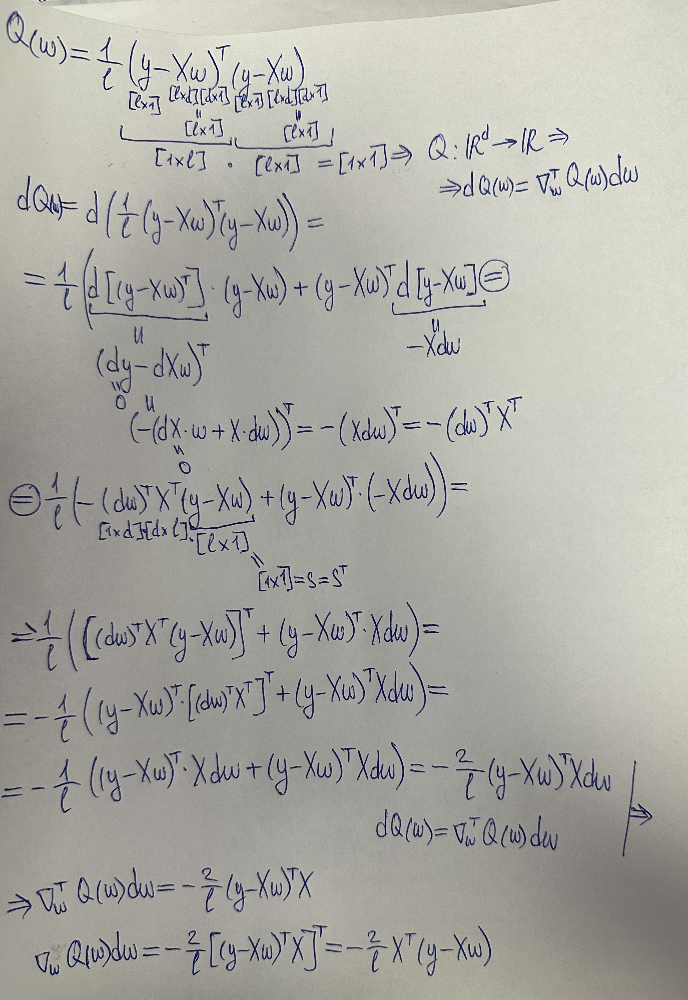

### Задание 1.1. Родительский класс BaseDescent (0.5 балла).

Реализуйте функции `calc_loss` (вычисление MSE для переданных $x$ и $y$) и `predict` (предсказание $y_{pred}$ для переданных $x$) в классе `BaseDescent`.

Все вычисления должны быть векторизованы.

### Задание 1.2. Полный градиентный спуск VanillaGradientDescent (0.5 балла).

Реализуйте полный градиентный спуск заполнив пропуски в классе `VanillaGradientDescent` в файле `descents.py`. Для вычисления градиента используйте формулу выше. Шаг оптимизации:

$$
    w_{k + 1} = w_{k} - \eta_{k} \nabla_{w} Q(w_{k}).
$$

Здесь и далее функция `update_weights` должна возвращать разницу между $w_{k + 1}$ и $w_{k}$: $\quad w_{k + 1} - w_{k} = -\eta_{k} \nabla_{w} Q(w_{k})$. Кроме того, соответственно своему названию, она должна обновлять веса.

Во всех методах градиентного спуска мы будем использовать следующую формулу для длины шага:

$$
    \eta_{k} = \lambda \left(\dfrac{s_0}{s_0 + k}\right)^p
$$

На практике достаточно настроить параметр $\lambda$, а остальным выставить параметры по умолчанию: $s_0 = 1, \, p = 0.5.$

### Лирическое-теоретическое отступление № 3

Как правило, в задачах машинного обучения функционал $Q(w)$ представим в виде суммы $\ell$ функций:

$$
    Q(w)
    =
    \frac{1}{\ell}
    \sum_{i = 1}^{\ell}
        q_i(w).
$$

В нашем домашнем задании отдельные функции $q_i(w)$ соответствуют ошибкам на отдельных объектах.

Проблема метода градиентного спуска состоит в том, что на каждом шаге необходимо вычислять градиент всей суммы (будем его называть полным градиентом):

$$
    \nabla_w Q(w)
    =
    \frac{1}{\ell}
    \sum_{i = 1}^{\ell}
        \nabla_w q_i(w).
$$

Это может быть очень трудоёмко при больших размерах выборки. В то же время точное вычисление градиента может быть не так уж необходимо &ndash; как правило, мы делаем не очень большие шаги в сторону антиградиента, и наличие в нём неточностей не должно сильно сказаться на общей траектории.

Оценить градиент суммы функций можно средним градиентов случайно взятого подмножества функций:

$$
    \nabla_{w} Q(w_{k}) \approx \dfrac{1}{|B|}\sum\limits_{i \in B}\nabla_{w} q_{i}(w_{k}),
$$
где $B$ - это случайно выбранное подмножество индексов.

В этом случае мы получим метод **стохастического градиентного спуска**.

### Задание 1.3. Стохастический градиентный спуск StochasticDescent (0.5 балла).

Реализуйте стохастический градиентный спуск заполнив пропуски в классе `StochasticDescent`. Для оценки градиента используйте формулу выше (среднее градиентов случайно выбранного батча объектов). Шаг оптимизации:

$$
    w_{k + 1} = w_{k} - \eta_{k} \dfrac{1}{|B|}\sum\limits_{i \in B}\nabla_{w} q_{i}(w_{k}).
$$

Размер батча будет являться гиперпараметром метода, семплируйте индексы для батча объектов с помощью `np.random.randint`.

### Лирическое-теоретическое отступление № 4

Может оказаться, что направление антиградиента сильно меняется от шага к шагу. Например, если линии уровня функционала сильно вытянуты, то из-за ортогональности градиента линиям уровня он будет менять направление на почти противоположное на каждом шаге. Такие осцилляции будут вносить сильный шум в движение, и процесс оптимизации займёт много итераций. Чтобы избежать этого, можно усреднять векторы антиградиента с нескольких предыдущих шагов &ndash; в этом случае шум уменьшится, и такой средний вектор будет указывать в сторону общего направления движения. Введём для этого вектор инерции:

\begin{align}
    &h_0 = 0, \\
    &h_{k + 1} = \alpha h_{k} + \eta_k \nabla_w Q(w_{k})
\end{align}

Здесь $\alpha$ &ndash; параметр метода, определяющей скорость затухания градиентов с предыдущих шагов. Разумеется, вместо вектора градиента может быть использована его аппроксимация. Чтобы сделать шаг градиентного спуска, просто сдвинем предыдущую точку на вектор инерции:

$$
    w_{k + 1} = w_{k} - h_{k + 1}.
$$

Заметим, что если по какой-то координате градиент постоянно меняет знак, то в результате усреднения градиентов в векторе инерции эта координата окажется близкой к нулю. Если же по координате знак градиента всегда одинаковый, то величина соответствующей координаты в векторе инерции будет большой, и мы будем делать большие шаги в соответствующем направлении.

### Задание 1.4 Метод Momentum MomentumDescent (0.5 балла).

Реализуйте градиентный спуск с методом инерции заполнив пропуски в классе `MomentumDescent`. Шаг оптимизации:

\begin{align}
    &h_0 = 0, \\
    &h_{k + 1} = \alpha h_{k} + \eta_k \nabla_w Q(w_{k}) \\
    &w_{k + 1} = w_{k} - h_{k + 1}.
\end{align}

$\alpha$ будет являться гиперпараметром метода, но в данном домашнем задании мы зафиксируем её за вас $\alpha = 0.9$.

### Лирическое-теоретическое отступление № 5

Градиентный спуск очень чувствителен к выбору длины шага. Если шаг большой, то есть риск, что мы будем перескакивать через точку минимума; если же шаг маленький, то для нахождения минимума потребуется много итераций. При этом нет способов заранее определить правильный размер шага &ndash; к тому же, схемы с постепенным уменьшением шага по мере итераций могут тоже плохо работать.

В методе AdaGrad предлагается сделать свою длину шага для каждой компоненты вектора параметров. При этом шаг будет тем меньше, чем более длинные шаги мы делали на предыдущих итерациях:

\begin{align}
    &G_{kj} = G_{k-1,j} + (\nabla_w Q(w_{k - 1}))_j^2; \\
    &w_{jk} = w_{j,k-1} - \frac{\eta_t}{\sqrt{G_{kj}} + \varepsilon} (\nabla_w Q(w_{k - 1}))_j.
\end{align}

Здесь $\varepsilon$ небольшая константа, которая предотвращает деление на ноль.

В данном методе можно зафксировать длину шага (например, $\eta_k = 0.01$) и не подбирать её в процессе обучения **(обратите внимание, что в данном домашнем задании длина шага не фиксируется)**. Отметим, что данный метод подходит для разреженных задач, в которых у каждого объекта большинство признаков равны нулю. Для признаков, у которых ненулевые значения встречаются редко, будут делаться большие шаги; если же какой-то признак часто является ненулевым, то шаги по нему будут небольшими.

У метода AdaGrad есть большой недостаток: переменная $G_{kj}$ монотонно растёт, из-за чего шаги становятся всё медленнее и могут остановиться ещё до того, как достигнут минимум функционала. Проблема решается в методе RMSprop, где используется экспоненциальное затухание градиентов:

$$
    G_{kj} = \alpha G_{k-1,j} + (1 - \alpha) (\nabla_w Q(w^{(k-1)}))_j^2.
$$

В этом случае размер шага по координате зависит в основном от того, насколько
быстро мы двигались по ней на последних итерациях.

Можно объединить идеи описанных выше методов: накапливать градиенты со всех прошлых шагов для
избежания осцилляций и делать адаптивную длину шага по каждому параметру.

### Задание 1.5. Метод Adam (Adaptive Moment Estimation) (1.5 балла).

Реализуйте градиентный спуск с методом Adam заполнив пропуски в классе `Adam`. Шаг оптимизации:

\begin{align}
    &m_0 = 0, \quad v_0 = 0; \\ \\
    &m_{k + 1} = \beta_1 m_k + (1 - \beta_1) \nabla_w Q(w_{k}); \\ \\
    &v_{k + 1} = \beta_2 v_k + (1 - \beta_2) \left(\nabla_w Q(w_{k})\right)^2; \\ \\
    &\widehat{m}_{k} = \dfrac{m_k}{1 - \beta_1^{k}}, \quad \widehat{v}_{k} = \dfrac{v_k}{1 - \beta_2^{k}}; \\ \\
    &w_{k + 1} = w_{k} - \dfrac{\eta_k}{\sqrt{\widehat{v}_{k + 1}} + \varepsilon} \widehat{m}_{k + 1}.
\end{align}

$\beta_1 = 0.9, \beta_2 = 0.999$ и $\varepsilon = 10^{-8}$ будут зафиксированы за вас.

## Задание 2. Реализация линейной регресии (0.5 балла)

В этом задании вам предстоит написать свою реализацию линейной регресии, обучаемой с использованием градиентного спуска, с опорой на подготовленные шаблоны в файле `linear_regression.py` - **LinearRegression**. По сути линейная регрессия будет оберткой, которая запускает обучение

Необходимо соблюдать следующие условия:

* Все вычисления должны быть векторизованы;
* Циклы средствами python допускаются только для итераций градиентного спуска;
* В качестве критерия останова необходимо использовать (одновременно):
    * Квадрат евклидовой нормы разности весов на двух соседних итерациях меньше `tolerance`;
    * Разность весов содержит наны;
    * Достижение максимального числа итераций `max_iter`.
* Будем считать, что все данные, которые поступают на вход имеют столбец единичек последним столбцом;
* Веса модели надо обновлять внутри функции `update_weights`, она неспроста так называется
* Чтобы проследить за сходимостью оптимизационного процесса будем использовать `loss_history`, в нём будем хранить значения функции потерь до каждого шага, начиная с нулевого (до первого шага по антиградиенту) и значение функции потерь после оптимизации.

## Задание 3. Проверка кода (0 баллов)

In [ ]:
!wget  -O 'descents.py' -q 'https://www.dropbox.com/scl/fi/azoh8xxc7w8v4gqm7zaij/descents.py?rlkey=n027sc3lryre3dew01tshe86j&st=weqdkbr0&dl=0'

!wget  -O 'linear_regression.py' -q 'https://www.dropbox.com/scl/fi/l171v5pf95pijxh6si38b/linear_regression.py?rlkey=vzkt7w1cth7nafk8du0lajdel&st=k9o2ypgc&dl=0'

In [ ]:
%load_ext autoreload

In [ ]:
%autoreload 2

import numpy as np

from descents import get_descent
from linear_regression import LinearRegression

In [ ]:
num_objects = 100
dimension = 5

x = np.random.rand(num_objects, dimension)
y = np.random.rand(num_objects)

In [ ]:
# Descents

descent_config = {
    'descent_name': 'some name that we will replace in the future',
    'kwargs': {
        'dimension': dimension
    }
}

for descent_name in ['full', 'stochastic', 'momentum', 'adam']:
    descent_config['descent_name'] = descent_name
    descent = get_descent(descent_config)

    diff = descent.step(x, y)
    gradient = descent.calc_gradient(x, y)
    predictions = descent.predict(x)

    assert gradient.shape[0] == dimension, f'Gradient failed for descent {descent_name}'
    assert diff.shape[0] == dimension, f'Weights failed for descent {descent_name}'
    assert predictions.shape == y.shape, f'Prediction failed for descent {descent_name}'

In [ ]:
# LinearRegression

max_iter = 10
tolerance = 0

descent_config = {
    'descent_name': 'stochastic',
    'kwargs': {
        'dimension': dimension,
        'batch_size': 10
    }
}

regression = LinearRegression(
    descent_config=descent_config,
    tolerance=tolerance,
    max_iter=max_iter
)

regression.fit(x, y)

assert len(regression.loss_history) == max_iter + 1, 'Loss history failed'

Если ваше решение прошло все тесты локально, то теперь пришло время протестировать его в [Яндекс Контесте](https://contest.yandex.ru/contest/70588/).

Для каждой задачи из контеста вставьте ссылку на успешную посылку:

* **VanillaGradientDescent**:
https://contest.yandex.ru/contest/70588/run-report/124638478/

* **StochasticDescent**:
https://contest.yandex.ru/contest/70588/run-report/124638505/

* **MomentumDescent**:
https://contest.yandex.ru/contest/70588/run-report/124638521/

* **Adam**:
https://contest.yandex.ru/contest/70588/run-report/124638687/

* **LinearRegression**:
https://contest.yandex.ru/contest/70588/run-report/124638710/

## Задание 4. Работа с данными (1 балл)

Мы будем использовать датасет объявлений по продаже машин на немецком Ebay. В задаче предсказания целевой переменной для нас будет являться цена.

* Постройте график распределения целевой переменной в данных, подумайте, нужно ли заменить её на логарифм. Присутствуют ли выбросы в данных с аномальной ценой? Если да, то удалите их из данных.

* Проведите исследование данных:
    * Проанализируйте тип столбцов, постройте графики зависимости целевой переменной от признака, распределения значений признака;
    * Подумайте (и напишите): какие признаки могут быть полезными на основе этих графиков, обработайте выбросы;
    * Подумайте (и напишите): какие трансформации признаков из известных вам будет уместно применить;
    * Разделите полезные признаки на категориальные, вещественные и те, которые не надо предобрабатывать.
* Разделите данные на обучающую, валидационную и тестовую выборки в отношении 8:1:1.

In [ ]:
import numpy as np
import pandas as pd  # при желании, можете заменить на polars/pyspark или что угодно, что вам нравится

import matplotlib.pyplot as plt
import seaborn as sns

from descents import get_descent
from linear_regression import LinearRegression

sns.set(style='darkgrid')

In [ ]:
%pylab inline
%matplotlib inline

%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = 8, 5
plt.rcParams['font.size'] = 12
mpl.rcParams['savefig.format'] = 'pdf'
sns.set_style('darkgrid')

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.10/dist-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['gradient', 'diff']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [ ]:
!wget  -O 'autos.csv' -q 'https://www.dropbox.com/scl/fi/n0uisc0p3mko81xpe1zsp/autos.csv?rlkey=oyhlhbwaicazprce82xw6wt4p&st=5m2z9k6r&dl=0'

In [ ]:
data = pd.read_csv('autos.csv')  # разумеется, если вы используете не pandas, это надо поменять

In [ ]:
data.head()

,brand,model,vehicleType,gearbox,fuelType,notRepairedDamage,powerPS,kilometer,autoAgeMonths,price
0,volkswagen,golf,kleinwagen,manuell,benzin,nein,75,150000,177,1500
1,skoda,fabia,kleinwagen,manuell,diesel,nein,69,90000,93,3600
2,bmw,3er,limousine,manuell,benzin,ja,102,150000,246,650
3,peugeot,2_reihe,cabrio,manuell,benzin,nein,109,150000,140,2200
4,mazda,3_reihe,limousine,manuell,benzin,nein,105,150000,136,2000


Колонки в данных:

* `brand` - название бренда автомобиля
* `model` - название модели автомобиля
* `vehicleType` - тип транспортного средства
* `gearbox` - тип трансмисcии
* `fuelType` - какой вид топлива использует автомобиль
* `notRepairedDamage` - есть ли в автомобиле неисправность, которая еще не устранена
* `powerPS` - мощность автомобиля в PS (метрическая лошадиная сила)
* `kilometer` - сколько километров проехал автомобиль, пробег
* `autoAgeMonths` - возраст автомобиля в месяцах


* `price` - цена, указанная в объявлении о продаже автомобиля (целевая переменная)

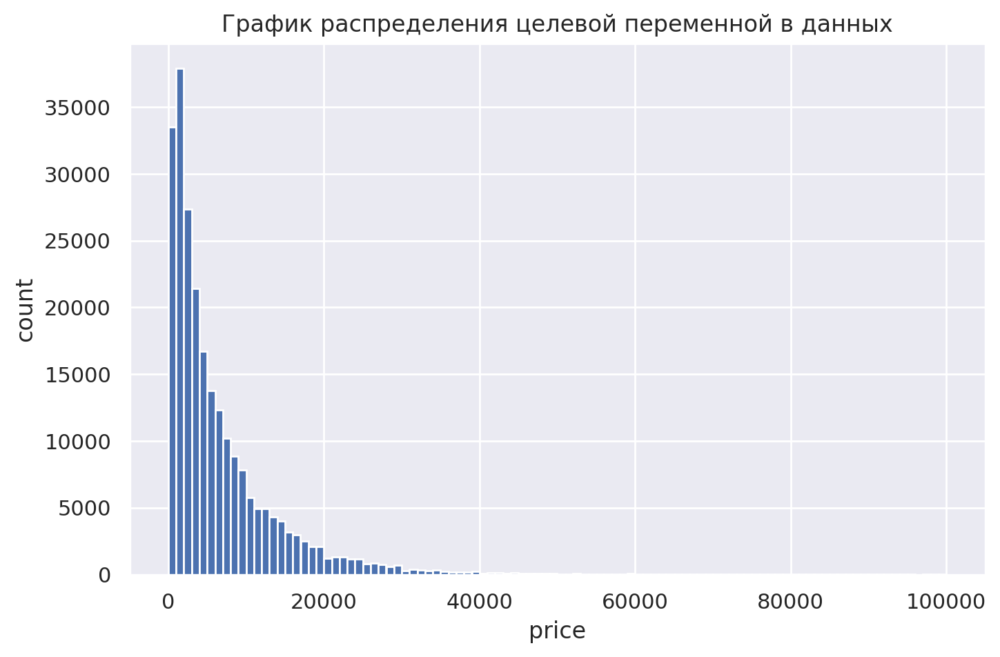

In [ ]:
y = data['price']
plt.hist(data['price'].values, bins=100)
plt.xlabel('price')
plt.ylabel('count')
plt.title('График распределения целевой переменной в данных')
plt.show()

Да, нужно заменить целевую переменную на ее логарифм, так как в основном ее значения сосредоточены возле нуля и большие значения встречаются намного реже по сравнению с маленькими. Будем использовать логарифм цены в качестве целевой переменной.

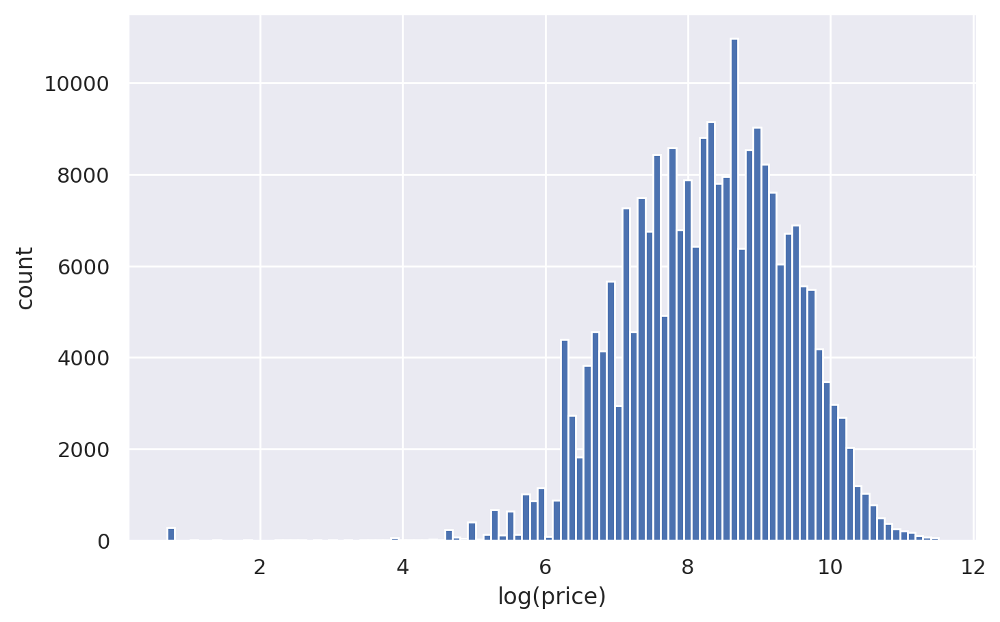

In [ ]:
data['log_price'] = np.log1p(data['price'].values)
plt.hist(data['log_price'].values, bins=100)
plt.xlabel('log(price)')
plt.ylabel('count')
plt.show()

Избавимся от выбросов (от 0.999% с наименьшим значением целевой переменной).

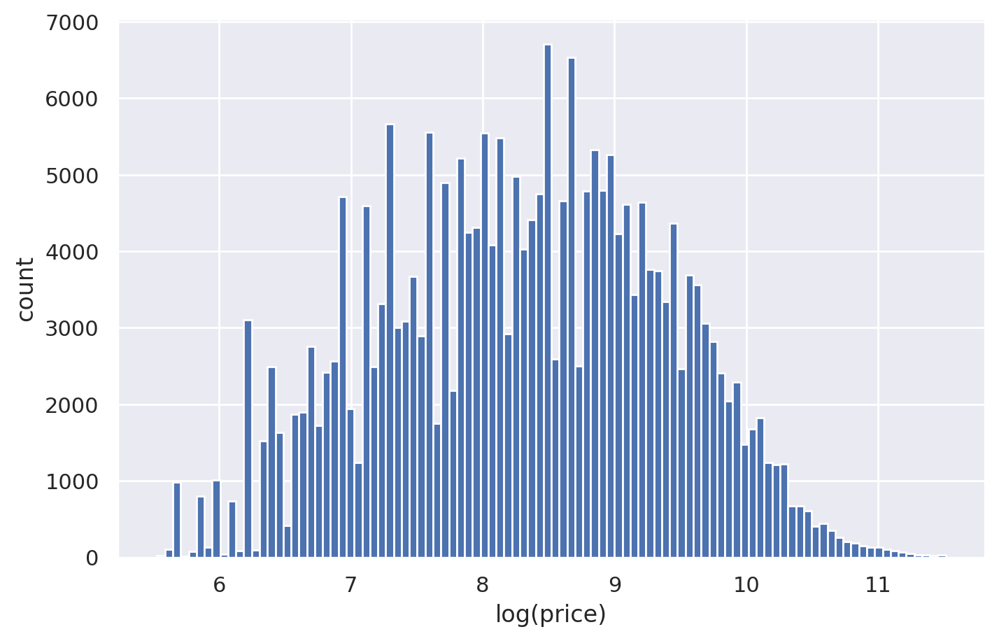

In [ ]:
mask = data['log_price'] > np.quantile(data['log_price'], 0.00999)
plt.hist(data[mask]['log_price'].values, bins=100)
plt.xlabel('log(price)')
plt.ylabel('count')
plt.show()

Это распределение лучше, поэтому, удалив выбросы, оставим только объекты из mask.

In [ ]:
data = data[mask]

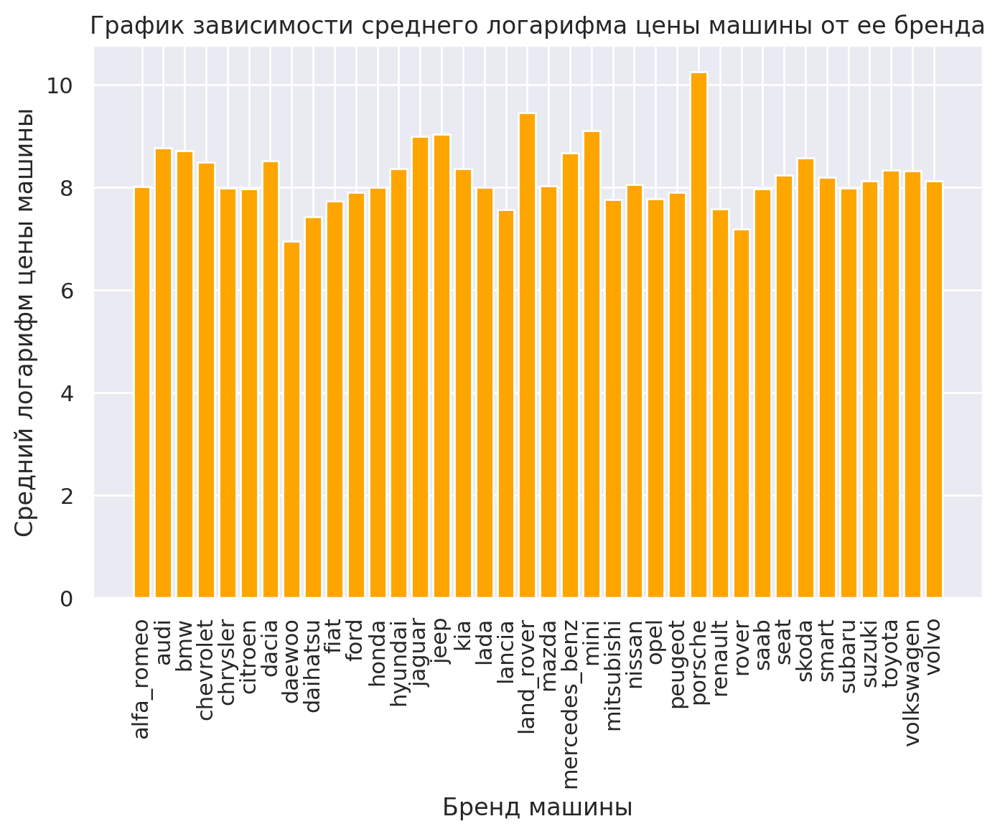

In [ ]:
ser_brand = data.groupby('brand')['log_price'].mean()
x = ser_brand.index
y = ser_brand
plt.bar(x, y, color='orange')
plt.xticks(rotation=90)

plt.xlabel('Бренд машины')
plt.ylabel('Средний логарифм цены машины')
plt.title('График зависимости среднего логарифма цены машины от ее бренда')
plt.show()

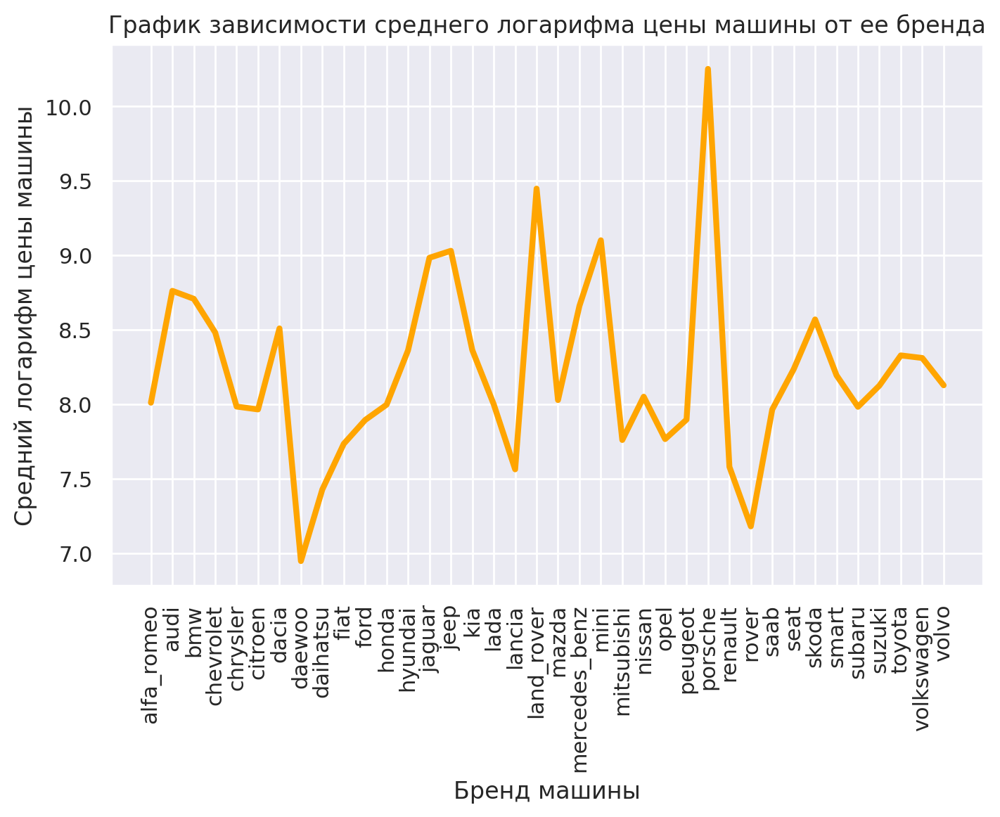

In [ ]:
#DELETE
plt.plot(x, y, color='orange', linewidth=3)
plt.xticks(rotation=90)
plt.xlabel('Бренд машины')
plt.ylabel('Средний логарифм цены машины')
plt.title('График зависимости среднего логарифма цены машины от ее бренда')
plt.show()


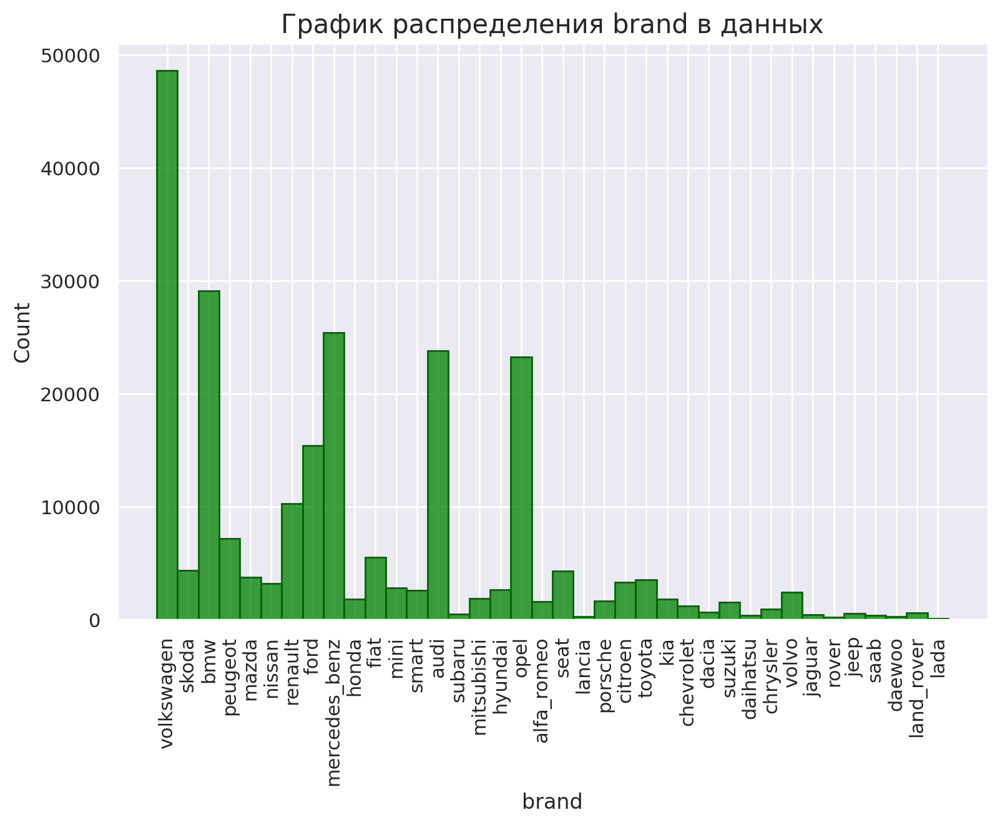

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('График распределения brand в данных', fontsize=15)
sns.histplot(data.brand,
             ax=ax,
             color='green',
             edgecolor='darkgreen')
ax.tick_params(axis='x', rotation=90)
plt.show()

Возьмем признак brand, так как он может помочь выявить закономерности для дорогих брендов.

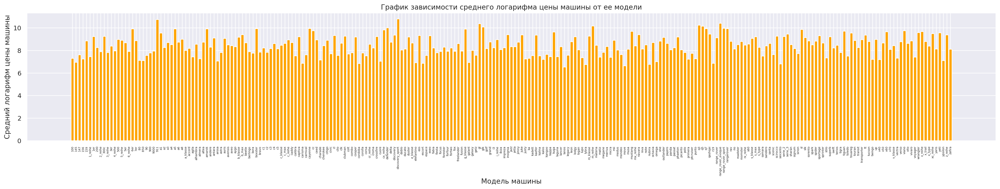

In [ ]:
ser_model = data.groupby('model')['log_price'].mean()
x = ser_model.index
y = ser_model
plt.figure(figsize=(30, 4))
plt.bar(x, y, color='orange')
plt.xticks(rotation=90)
plt.xticks(fontsize=5)
plt.xlabel('Модель машины')
plt.ylabel('Средний логарифм цены машины')
plt.title('График зависимости среднего логарифма цены машины от ее модели')
plt.show()

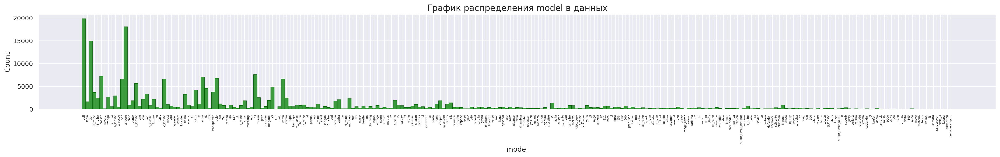

In [ ]:
fig, ax = plt.subplots(figsize=(30, 3))
ax.set_title('График распределения model в данных', fontsize=15)
sns.histplot(data.model,
             ax=ax,
             color='green',
             edgecolor='darkgreen')
ax.tick_params(axis='x', rotation=90, labelsize=5)
plt.show()

Не будем брать этот признак, так как очень мало объектов в большинстве групп (самих групп очень много), и распределение средней цены в большинстве моделей примерно одинаковое. Тем более мы уже взяли признак brand.

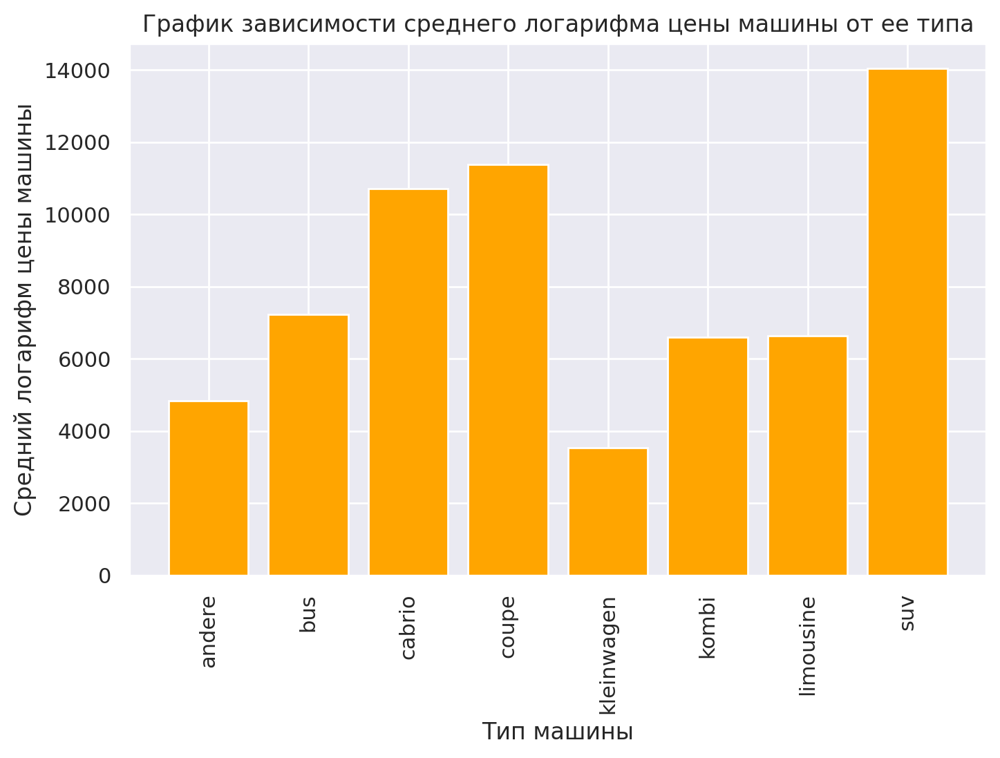

In [ ]:
ser_vehicleType = data.groupby('vehicleType')['price'].mean()
x = ser_vehicleType.index
y = ser_vehicleType
plt.bar(x, y, color='orange')

plt.xticks(rotation=90)
plt.xlabel('Тип машины')
plt.ylabel('Средний логарифм цены машины')
plt.title('График зависимости среднего логарифма цены машины от ее типа')

plt.show()

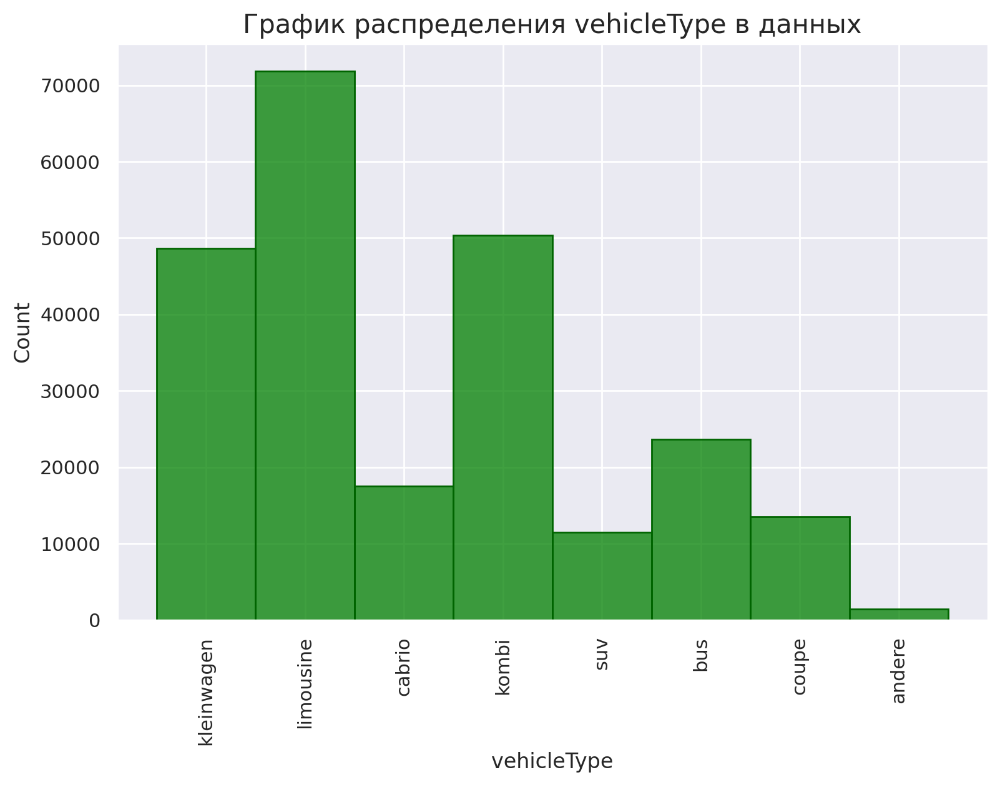

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('График распределения vehicleType в данных', fontsize=15)
sns.histplot(data.vehicleType,
             ax=ax,
             color='green',
             edgecolor='darkgreen')
ax.tick_params(axis='x', rotation=90)
plt.show()

Возьмем этот признак, так как заметны различия в средней цене в зависимости от типа машины (более того, в каждой группе присутствует достаточно много объектов).

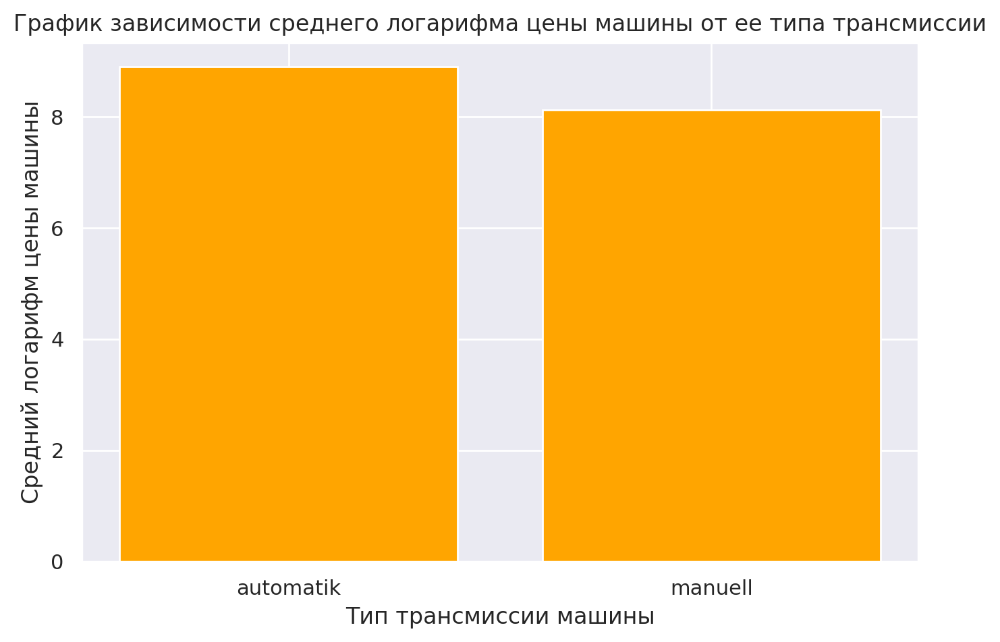

In [ ]:
ser_gearbox = data.groupby('gearbox')['log_price'].mean()
x = ser_gearbox.index
y = ser_gearbox
plt.bar(x, y, color='orange')


plt.xlabel('Тип трансмиссии машины')
plt.ylabel('Средний логарифм цены машины')
plt.title('График зависимости среднего логарифма цены машины от ее типа трансмиссии')

plt.show()

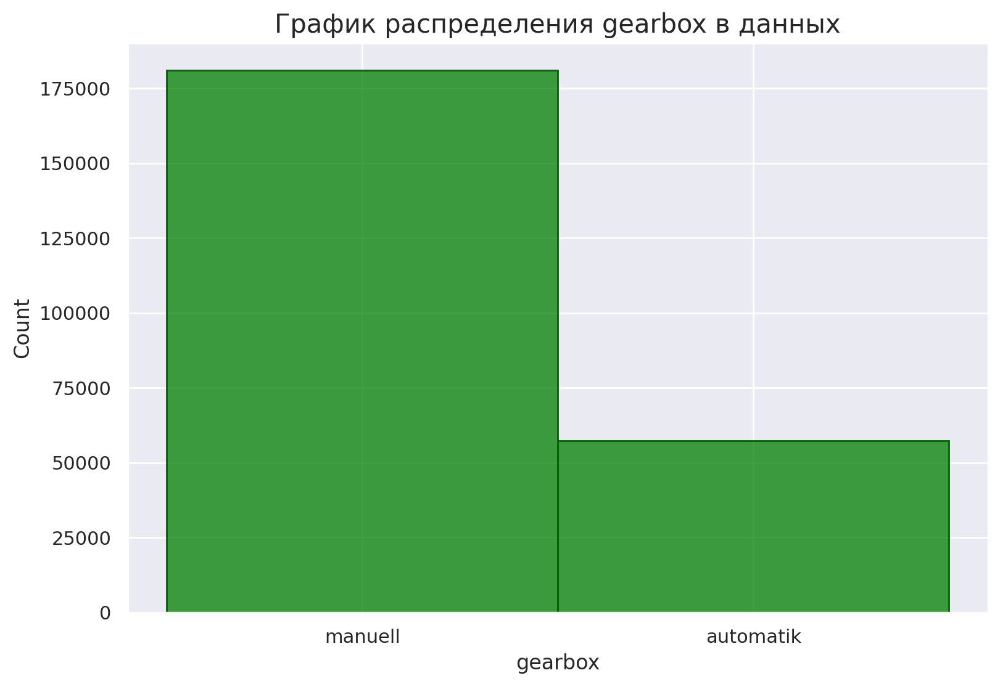

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('График распределения gearbox в данных', fontsize=15)
sns.histplot(data.gearbox,
             ax=ax,
             color='green',
             edgecolor='darkgreen')

plt.show()

Возьмем этот признак, так как есть различия в среднем значении целевой переменной.

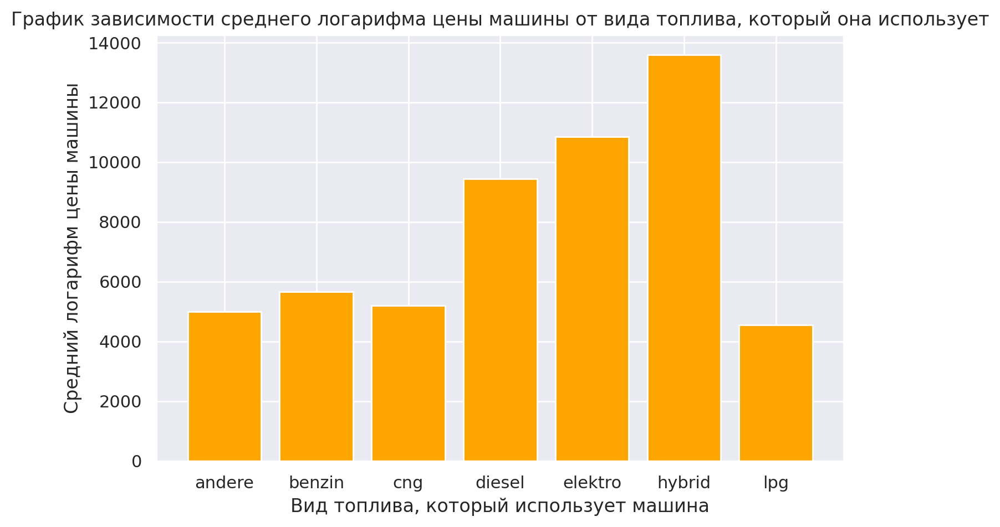

In [ ]:
ser_fuelType = data.groupby('fuelType')['price'].mean()
x = ser_fuelType.index
y = ser_fuelType
plt.bar(x, y, color='orange')


plt.xlabel('Вид топлива, который использует машина')
plt.ylabel('Средний логарифм цены машины')
plt.title('График зависимости среднего логарифма цены машины от вида топлива, который она использует')

plt.show()

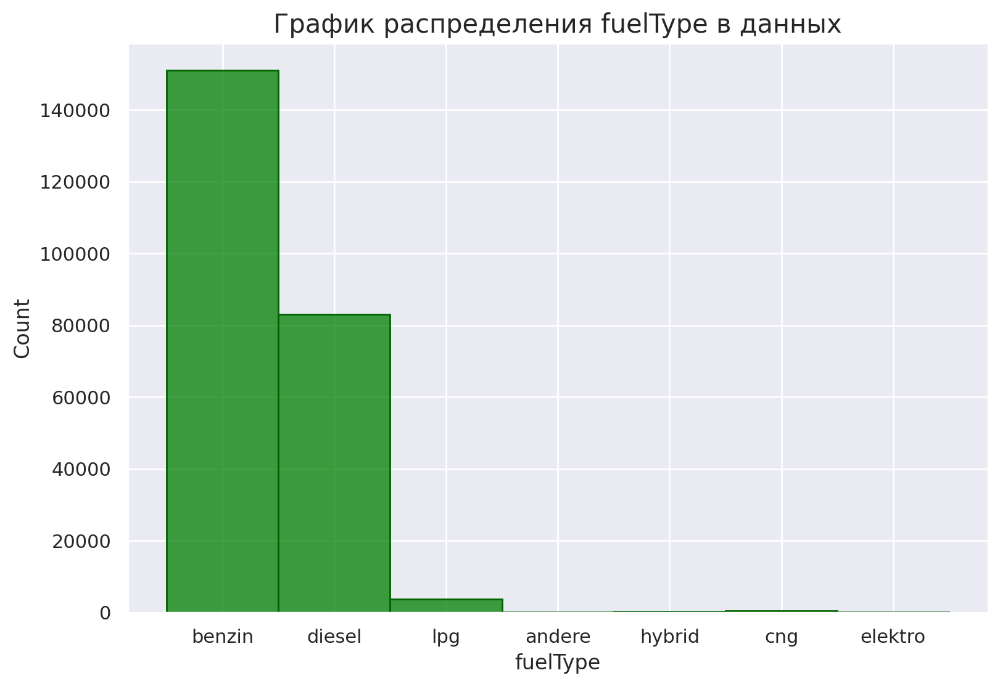

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('График распределения fuelType в данных', fontsize=15)
sns.histplot(data.fuelType,
             ax=ax,
             color='green',
             edgecolor='darkgreen')

plt.show()

Возьмем это признак тоже, так как есть различия в среднем значении целевой переменной.

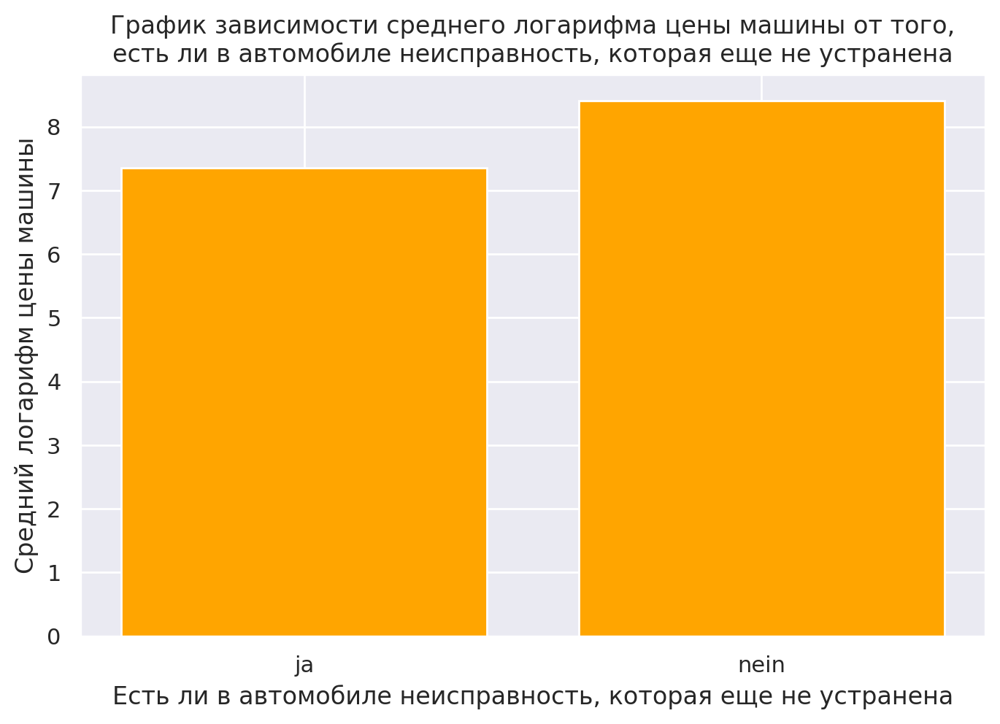

In [ ]:
ser_notRepairedDamage = data.groupby('notRepairedDamage')['log_price'].mean()
x = ser_notRepairedDamage.index
y = ser_notRepairedDamage
plt.bar(x, y, color='orange')


plt.xlabel('Есть ли в автомобиле неисправность, которая еще не устранена')
plt.ylabel('Средний логарифм цены машины')
plt.title('График зависимости среднего логарифма цены машины от того,\nесть ли в автомобиле неисправность, которая еще не устранена')

plt.show()

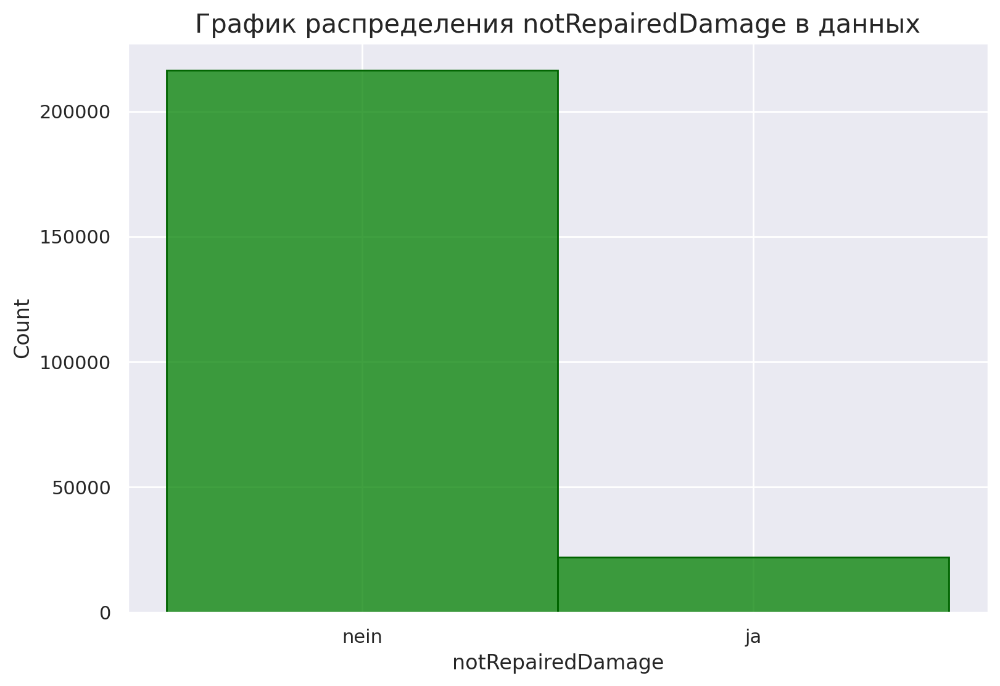

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('График распределения notRepairedDamage в данных', fontsize=15)
sns.histplot(data.notRepairedDamage,
             ax=ax,
             color='green',
             edgecolor='darkgreen')

plt.show()

Этот признак хороший (и различия в целевой переменной есть, и объектов много в каждой группе) - берем его.

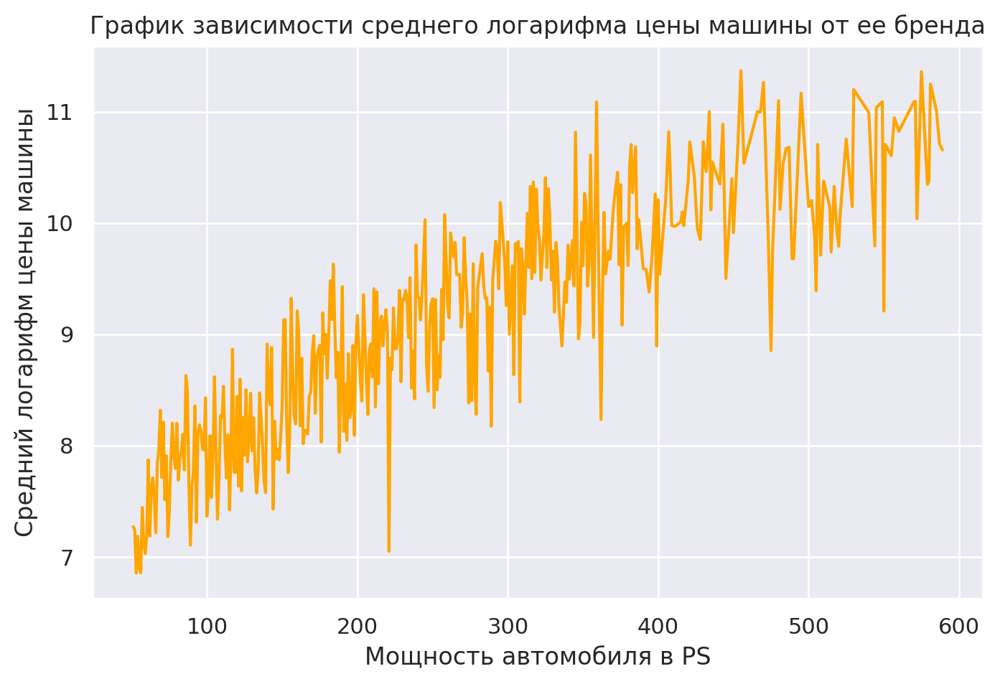

In [ ]:
ser_powerPS = data.groupby('powerPS')['log_price'].mean()
x = ser_powerPS.index
y = ser_powerPS

plt.plot(x, y, color='orange')

plt.xlabel('Мощность автомобиля в PS')
plt.ylabel('Средний логарифм цены машины')
plt.title('График зависимости среднего логарифма цены машины от ее бренда')
plt.show()

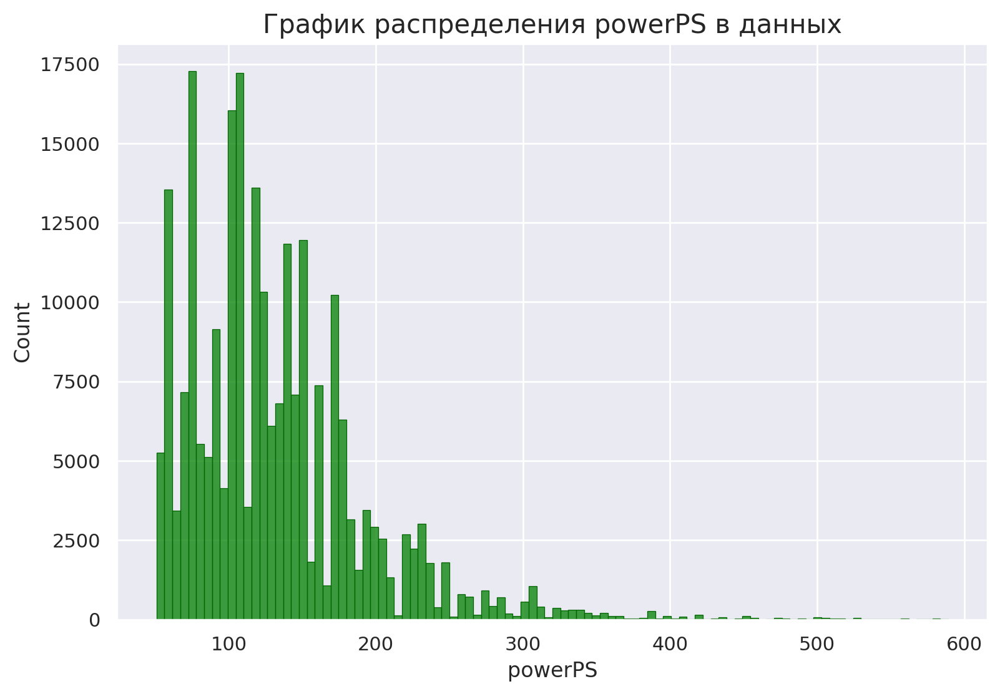

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('График распределения powerPS в данных', fontsize=15)
sns.histplot(data.powerPS,
             ax=ax,
             bins=100,
             color='green',
             edgecolor='darkgreen')

plt.show()

In [ ]:
mask = data['powerPS'] < np.quantile(data['powerPS'], 0.995)

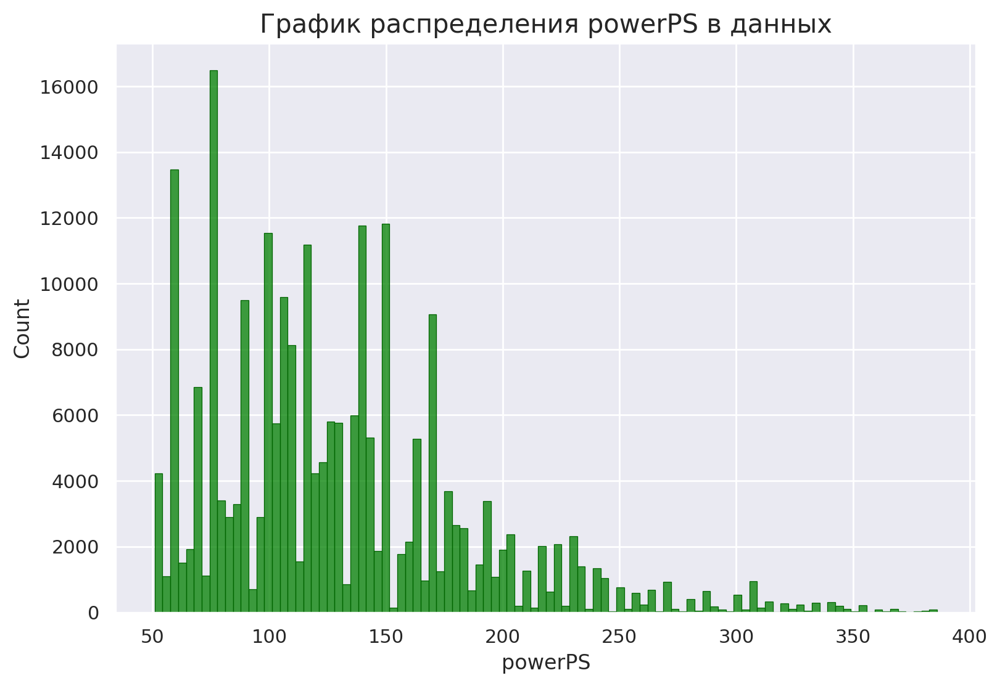

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('График распределения powerPS в данных', fontsize=15)
sns.histplot(data[mask].powerPS,
             ax=ax,
             bins=100,
             color='green',
             edgecolor='darkgreen')

plt.show()

Избавимся от выбросов (от 0.5% с наибольшим значением целевой переменной).

In [ ]:
data = data[mask]

Берем этот количественный признак, так как значения целевой переменной уменьшаются в среднем с ростом значения признака.

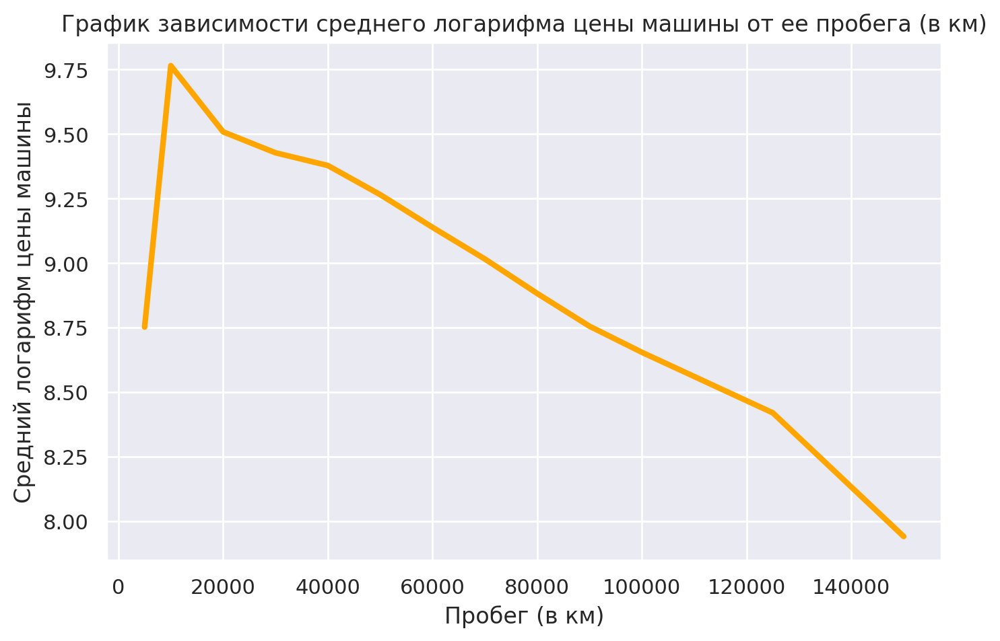

In [ ]:
ser_kilometer = data.groupby('kilometer')['log_price'].mean()
x = ser_kilometer.index
y = ser_kilometer

plt.plot(x, y, color='orange', linewidth=3)

plt.xlabel('Пробег (в км)')
plt.ylabel('Средний логарифм цены машины')
plt.title('График зависимости среднего логарифма цены машины от ее пробега (в км)')
plt.show()

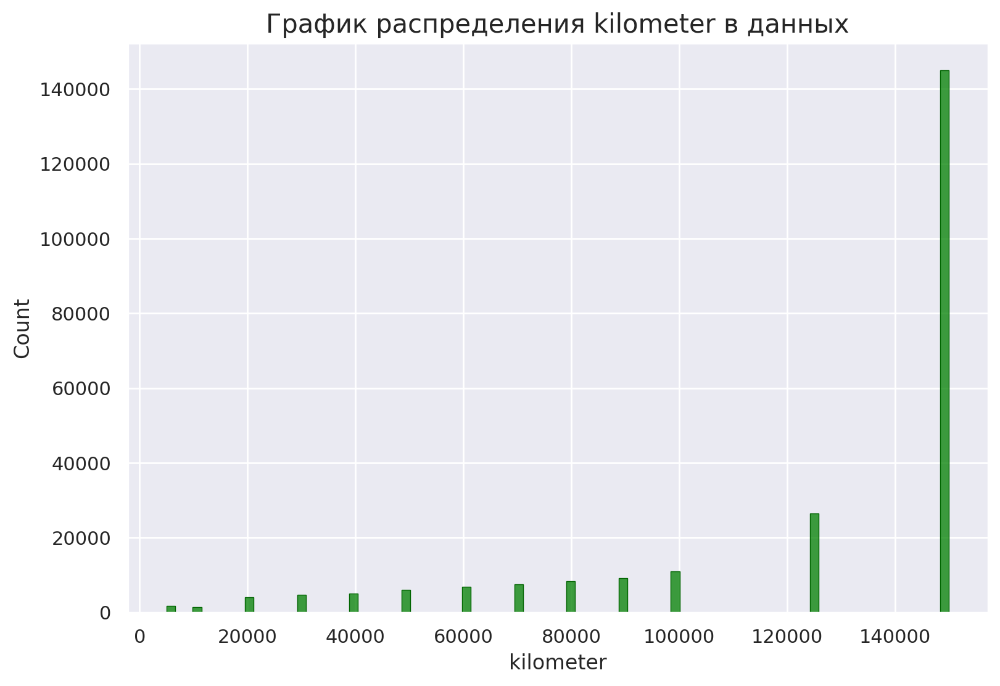

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('График распределения kilometer в данных', fontsize=15)
sns.histplot(data.kilometer,
             ax=ax,

             color='green',
             edgecolor='darkgreen')

plt.show()

Берем этот количественный признак, так как значения целевой переменной возрастают в среднем с ростом значения признака.

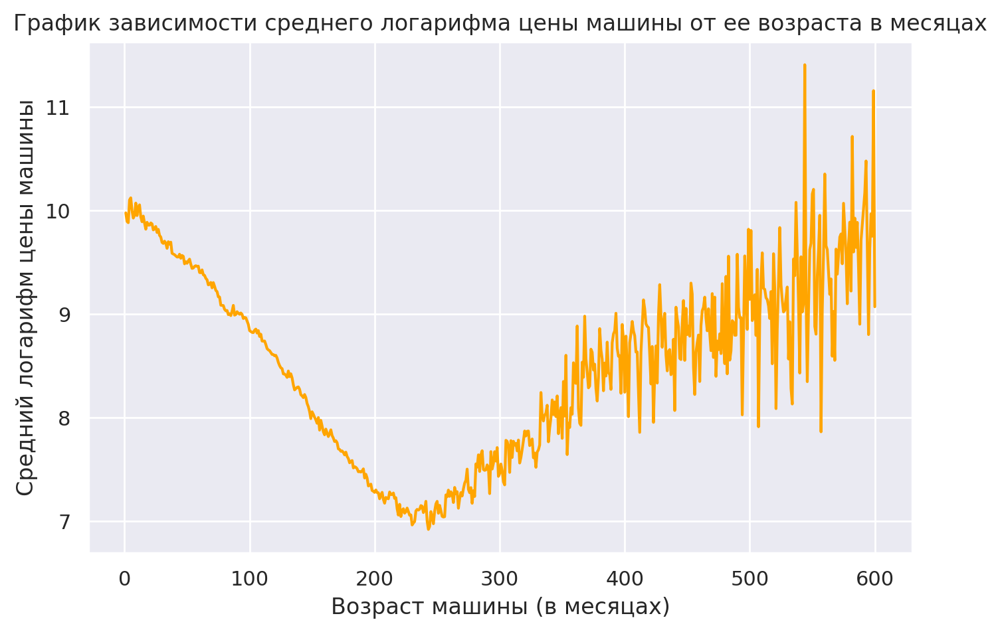

In [ ]:
ser_autoAgeMonths = data.groupby('autoAgeMonths')['log_price'].mean()
x = ser_autoAgeMonths.index
y = ser_autoAgeMonths

plt.plot(x, y, color='orange')

plt.xlabel('Возраст машины (в месяцах)')
plt.ylabel('Средний логарифм цены машины')
plt.title('График зависимости среднего логарифма цены машины от ее возраста в месяцах')
plt.show()

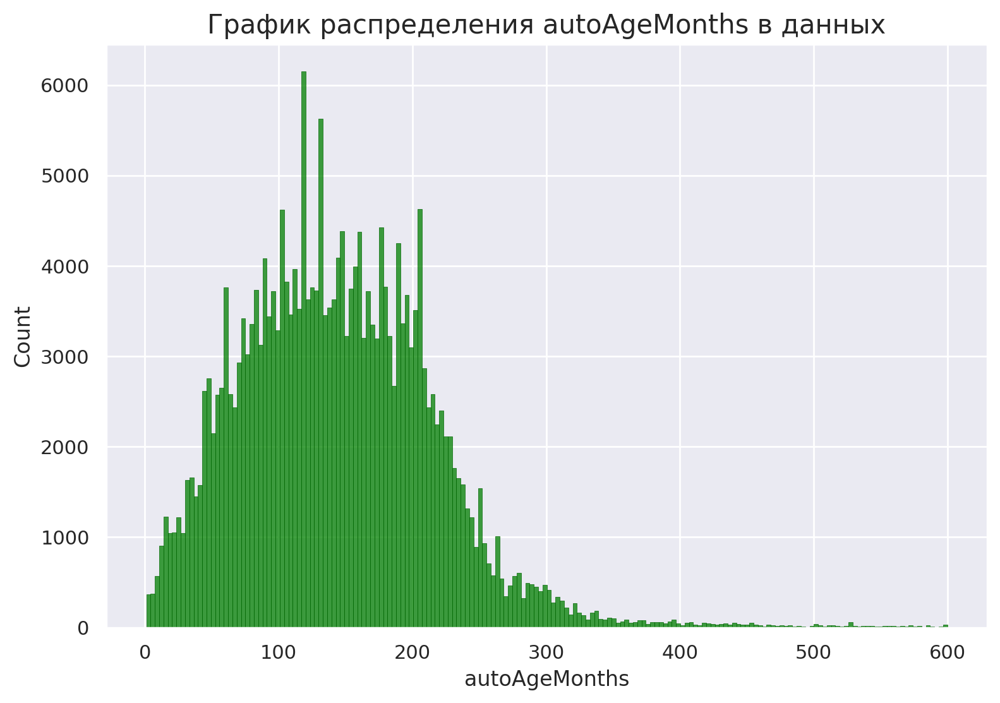

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('График распределения autoAgeMonths в данных', fontsize=15)
sns.histplot(data.autoAgeMonths,
             ax=ax,

             color='green',
             edgecolor='darkgreen')

plt.show()

In [ ]:
mask = data['autoAgeMonths'] < np.quantile(data['autoAgeMonths'], 0.995)

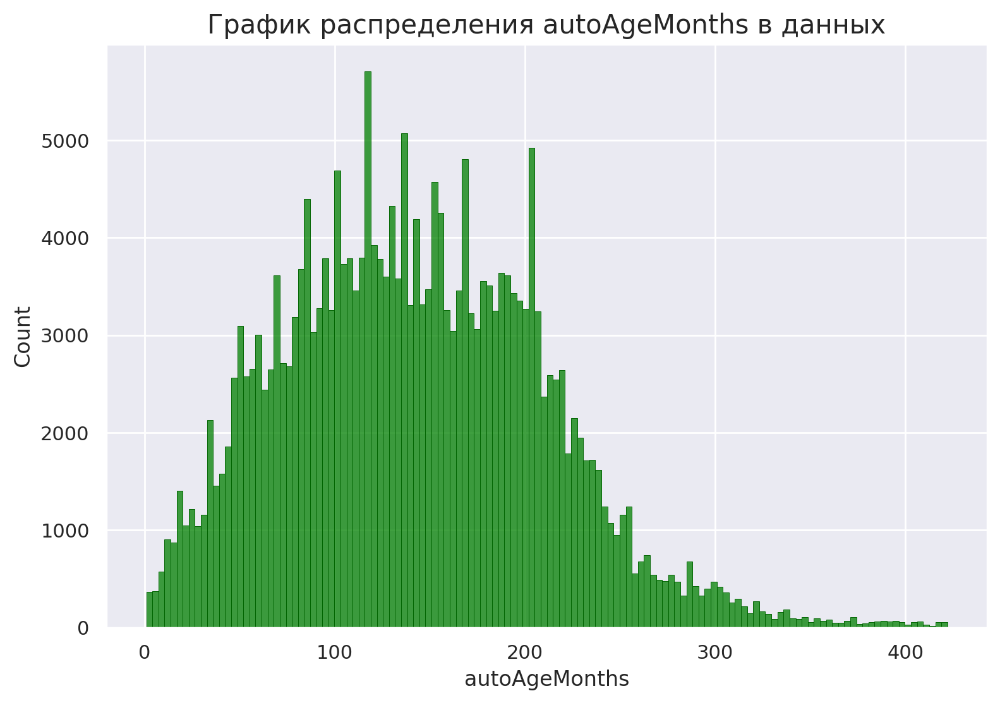

In [ ]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('График распределения autoAgeMonths в данных', fontsize=15)
sns.histplot(data[mask].autoAgeMonths,
             ax=ax,

             color='green',
             edgecolor='darkgreen')
plt.show()

Избавимся от выбросов (от 0.5% с наибольшим значением целевой переменной).

In [ ]:
data = data[mask]

Берем этот количественный признак, так как значения целевой переменной вначале растут, а потом падают в среднем с ростом значения признака.

Будет уместно применить OHE к категориальным, StandardScaler к числовым и к other можно было бы применить OHE, но сделаем умнее, так как признак принимает всего два значения, по этому заменим их на 0/1.

In [ ]:
categorical = ['brand', 'vehicleType', 'fuelType']
numeric = ['powerPS', 'kilometer', 'autoAgeMonths']
other = ['gearbox', 'notRepairedDamage']

# YOUR CODE (EDA): он выше

Переделаем other признаки в 0/1 формат

In [ ]:
data.loc[data['gearbox'] == 'automatik', 'gearbox'] = 1
data.loc[data['gearbox'] == 'manuell', 'gearbox'] = 0

In [ ]:
data.loc[data['notRepairedDamage'] == 'ja', 'notRepairedDamage'] = 1
data.loc[data['notRepairedDamage'] == 'nein', 'notRepairedDamage'] = 0

In [ ]:
data['bias'] = 1
other += ['bias']

x = data[categorical + numeric + other]
y = data['log_price']

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler


column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical),
    ('scaling', StandardScaler(), numeric),
    ('other',  'passthrough', other)
])

x = column_transformer.fit_transform(x)

In [ ]:
# YOUR CODE (data split into train/val/test):
from sklearn.model_selection import train_test_split
X_train, X_val_test, y_train, y_val_test = train_test_split(x, y, test_size=0.2, random_state=7)

In [ ]:
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size=0.5, random_state=7)

## Задание 5. Сравнение методов градиентного спуска (2 балла)

В этом задании вам предстоит сравнить методы градиентного спуска на подготовленных вами данных из предыдущего задания.

### Задание 5.1. Подбор оптимальной длины шага (1 балл)

Подберите по валидационной выборке наилучшую длину шага $\lambda$ для каждого метода с точки зрения ошибки. Для этого сделайте перебор по логарифмической сетке. Для каждого метода посчитайте ошибку на обучающей и тестовой выборках, посчитайте качество по метрике $R^2$, сохраните количество итераций до сходимости.

Все параметры кроме `lambda_` стоит выставить равным значениям по умолчанию.

In [ ]:
# YOUR CODE:
# посчитаем лучшую лямбду для VanillaGradientDescent
lambda_vars = np.logspace(-3, 1, num=25)
losses= []
for lam in lambda_vars:
  descent_config = {
      'descent_name': 'full',
      'kwargs': {
          'dimension': X_train.shape[1],
          'lambda_': lam
      }
  }
  regression = LinearRegression(
      descent_config
      )
  regression.fit(X_train, y_train)
  losses.append(regression.calc_loss(X_val, y_val))
losses_arr = np.array(losses)
min_ind = np.argmin(losses_arr)
best_lambda_full = lambda_vars[min_ind]
best_lambda_full



3.1622776601683795

In [ ]:
descent_config = {
      'descent_name': 'full',
      'kwargs': {
          'dimension': X_train.shape[1],
          'lambda_': best_lambda_full
      }
  }
regression = LinearRegression(
    descent_config
    )
regression.fit(X_train, y_train)
from sklearn.metrics import r2_score
train_mse_full = regression.calc_loss(X_train, y_train)
test_mse_full = regression.calc_loss(X_test, y_test)
train_r2score_full = r2_score(y_train, regression.predict(X_train))
test_r2_score_full = r2_score(y_test, regression.predict(X_test))
print("Train MSE = %.4f" % train_mse_full)
print("Test MSE = %.4f" % test_mse_full)
print("Train R2 = %.4f" % train_r2score_full)
print("Test R2 = %.4f" % test_r2_score_full)

Train MSE = 0.2439
Test MSE = 0.2430
Train R2 = 0.7890
Test R2 = 0.7885


In [ ]:
loss_history_full = regression.loss_history
len(loss_history_full)

87

In [ ]:
full_metrics = np.array([train_mse_full, test_mse_full, train_r2score_full, test_r2_score_full, len(loss_history_full)])

In [ ]:
# посчитаем лучшую лямбду для StochasticDescent
losses= []
for lam in lambda_vars:
  descent_config = {
      'descent_name': 'stochastic',
      'kwargs': {
          'dimension': X_train.shape[1],
          'lambda_': lam
      }
  }
  regression = LinearRegression(
      descent_config
      )
  regression.fit(X_train, y_train.reset_index(drop=True))
  losses.append(regression.calc_loss(X_val, y_val.reset_index(drop=True)))
losses_arr = np.array(losses)
min_ind = np.argmin(losses_arr)
best_lambda_stochastic = lambda_vars[min_ind]
best_lambda_stochastic

1.0

In [ ]:
descent_config = {
      'descent_name': 'stochastic',
      'kwargs': {
          'dimension': X_train.shape[1],
          'lambda_': best_lambda_stochastic
      }
  }
regression = LinearRegression(
    descent_config
    )
regression.fit(X_train, y_train.reset_index(drop=True))

train_mse_stochastic = regression.calc_loss(X_train, y_train)
test_mse_stochastic = regression.calc_loss(X_test, y_test)
train_r2score_stochastic = r2_score(y_train, regression.predict(X_train))
test_r2_score_stochastic = r2_score(y_test, regression.predict(X_test))
print("Train MSE = %.4f" % train_mse_stochastic)
print("Test MSE = %.4f" % test_mse_stochastic)
print("Train R2 = %.4f" % train_r2score_stochastic)
print("Test R2 = %.4f" % test_r2_score_stochastic)

Train MSE = 0.2622
Test MSE = 0.2615
Train R2 = 0.7732
Test R2 = 0.7724


In [ ]:
loss_history_stochastic = regression.loss_history
len(loss_history_stochastic)

301

In [ ]:
stochastic_metrics = np.array([train_mse_stochastic, test_mse_stochastic, train_r2score_stochastic, test_r2_score_stochastic, len(loss_history_stochastic)])

In [ ]:
# посчитаем лучшую лямбду для MomentumDescent
losses= []
for lam in lambda_vars:
  descent_config = {
      'descent_name': 'momentum',
      'kwargs': {
          'dimension': X_train.shape[1],
          'lambda_': lam
      }
  }
  regression = LinearRegression(
      descent_config
      )
  regression.fit(X_train, y_train)
  losses.append(regression.calc_loss(X_val, y_val))
losses_arr = np.array(losses)
min_ind = np.argmin(losses_arr)
best_lambda_momentum = lambda_vars[min_ind]
best_lambda_momentum

1.467799267622069

In [ ]:
descent_config = {
      'descent_name': 'momentum',
      'kwargs': {
          'dimension': X_train.shape[1],
          'lambda_': best_lambda_momentum
      }
  }
regression = LinearRegression(
    descent_config
    )
regression.fit(X_train, y_train)

train_mse_momentum = regression.calc_loss(X_train, y_train)
test_mse_momentum = regression.calc_loss(X_test, y_test)
train_r2score_momentum = r2_score(y_train, regression.predict(X_train))
test_r2_score_momentum = r2_score(y_test, regression.predict(X_test))
print("Train MSE = %.4f" % train_mse_momentum)
print("Test MSE = %.4f" % test_mse_momentum)
print("Train R2 = %.4f" % train_r2score_momentum)
print("Test R2 = %.4f" % test_r2_score_momentum)

Train MSE = 0.2379
Test MSE = 0.2364
Train R2 = 0.7942
Test R2 = 0.7943


In [ ]:
loss_history_momentum = regression.loss_history
len(loss_history_momentum)

107

In [ ]:
momentum_metrics = np.array([train_mse_momentum, test_mse_momentum, train_r2score_momentum, test_r2_score_momentum, len(loss_history_momentum)])

In [ ]:
# посчитаем лучшую лямбду для Adam
losses= []
for lam in lambda_vars:
  descent_config = {
      'descent_name': 'adam',
      'kwargs': {
          'dimension': X_train.shape[1],
          'lambda_': lam
      }
  }
  regression = LinearRegression(
      descent_config
      )
  regression.fit(X_train, y_train)
  losses.append(regression.calc_loss(X_val, y_val))
losses_arr = np.array(losses)
min_ind = np.argmin(losses_arr)
best_lambda_adam = lambda_vars[min_ind]
best_lambda_adam

2.154434690031882

In [ ]:
descent_config = {
      'descent_name': 'adam',
      'kwargs': {
          'dimension': X_train.shape[1],
          'lambda_': best_lambda_adam
      }
  }
regression = LinearRegression(
    descent_config
    )
regression.fit(X_train, y_train)

train_mse_adam = regression.calc_loss(X_train, y_train)
test_mse_adam = regression.calc_loss(X_test, y_test)
train_r2score_adam = r2_score(y_train, regression.predict(X_train))
test_r2_score_adam = r2_score(y_test, regression.predict(X_test))
print("Train MSE = %.4f" % train_mse_adam)
print("Test MSE = %.4f" % test_mse_adam)
print("Train R2 = %.4f" % train_r2score_adam)
print("Test R2 = %.4f" % test_r2_score_adam)

Train MSE = 0.2325
Test MSE = 0.2316
Train R2 = 0.7989
Test R2 = 0.7985


In [ ]:
loss_history_adam = regression.loss_history
len(loss_history_adam)

83

In [ ]:
adam_metrics = np.array([train_mse_adam, test_mse_adam, train_r2score_adam, test_r2_score_adam, len(loss_history_adam)])

### Задание 5.2. Сравнение методов (1 балла)

Постройте график зависимости ошибки на обучающей выборке от номера итерации (все методы на одном графике).

Посмотрите на получившиеся результаты (таблички с метриками и график). Сравните методы между собой.

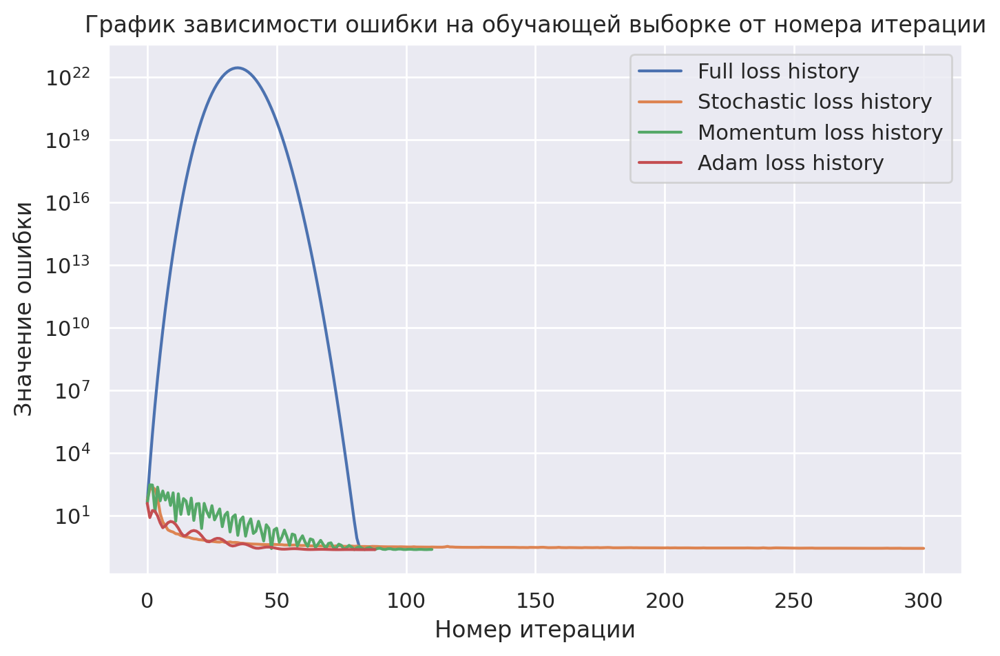

In [ ]:
# YOUR CODE:
ser_full = pd.Series(loss_history_full)
ser_stochastic = pd.Series(loss_history_stochastic)
ser_momentum = pd.Series(loss_history_momentum)
ser_adam = pd.Series(loss_history_adam)
plt.plot(ser_full, label='Full loss history')
plt.plot(ser_stochastic, label='Stochastic loss history')
plt.plot(ser_momentum, label='Momentum loss history')
plt.plot(ser_adam, label='Adam loss history')
plt.title('График зависимости ошибки на обучающей выборке от номера итерации')
plt.yscale('log')
plt.xlabel('Номер итерации')
plt.ylabel('Значение ошибки')
plt.legend()
plt.show()

`### ваше решение тут ###`

In [ ]:
array_metrics = np.array([full_metrics, stochastic_metrics, momentum_metrics, adam_metrics])
df_metrics = pd.DataFrame(array_metrics, columns=['train_mse', 'test_mse', 'train_r2score', 'test_r2score', 'length_loss_history'], index=['full', 'stochastic', 'momentum', 'adam'])
df_metrics

,train_mse,test_mse,train_r2score,test_r2score,length_loss_history
full,0.243924,0.243037,0.789001,0.788493,87.0
stochastic,0.262157,0.261504,0.773228,0.772422,301.0
momentum,0.237946,0.236384,0.794171,0.794283,107.0
adam,0.232529,0.231578,0.798857,0.798466,83.0


По графику ошибка на VanillaGD вначале резко увеличивается, а потом уменьшается с ростом числа итераций спуска. Это может быть связано с большой подобранной лямбдой (длиной шага).

Что касается ошибки на MomentumGD, она показывает быстрое снижение засчет накопленного момента.

Ошибка на StochasticGD плавно уменьшается с ростом числа итераций, что может быть связано с обновлением градиента только на нескольких объектах из батча.

Что касается ошибки на AdamGD, он обладает плавной сходимостью и не такими сильными колибаниями, как MomentumGD, так как сочетает в себе момент и адаптивный learning rate.

Судя по метрикам, StochasticGD работает хуже всех (и сходится медленнее всех). Это можно объяснить, тем, что он примерно оценивает градиент по причине, описанной выше. MomentumGD работает лучше VanillaGD и StochasticGD, так как решает проблему осцилляций поскольку суммирует новый градиент с суммой предыдущих. AdamGD работает лучше всех (он даже сходится быстрее VanillaGD), так как сочетает в себе и инерцию из MomentumGD, и адаптивность шага из AdaGradGD.

## Задание 6. Стохастический градиентный спуск и размер батча (1 балл)

В этом задании вам предстоит исследовать влияние размера батча на работу стохастического градиентного спуска.

* Сделайте по несколько запусков (например, k = 10) стохастического градиентного спуска на обучающей выборке для каждого размера батча из перебираемого списка. Замерьте время в секундах и количество итераций до сходимости. Посчитайте среднее этих значений для каждого размера батча.
* Постройте график зависимости количества шагов до сходимости от размера батча. _(под сходимостью понимается достижение критерия останова)_
* Постройте график зависимости времени до сходимости от размера батча.

Посмотрите на получившиеся результаты. Какие выводы можно сделать про подбор размера батча для стохастического градиентного спуска?

`### ваше решение тут ###`

In [ ]:
# YOUR CODE:
import time
batch_sizes = np.arange(5, 500, 10)
arr_mean_time = []
arr_mean_iter = []
for batch in batch_sizes:
  times = []
  iter_length = []
  for i in range(15):
    descent_config = {
      'descent_name': 'stochastic',
      'kwargs': {
          'dimension': X_train.shape[1],
          'batch_size': batch,
          'lambda_': best_lambda_stochastic
      }
    }
    time_start = time.time()
    regression = LinearRegression(
        descent_config
        )
    regression.fit(X_train, np.array(y_train))

    time_end = time.time() - time_start
    times.append(time_end)
    length_loss = len(regression.loss_history)
    iter_length.append(length_loss - 1)

  time_mean = np.mean(np.array(times))
  iter_mean = np.mean(np.array(iter_length))

  arr_mean_time.append(time_mean)
  arr_mean_iter.append(iter_mean)

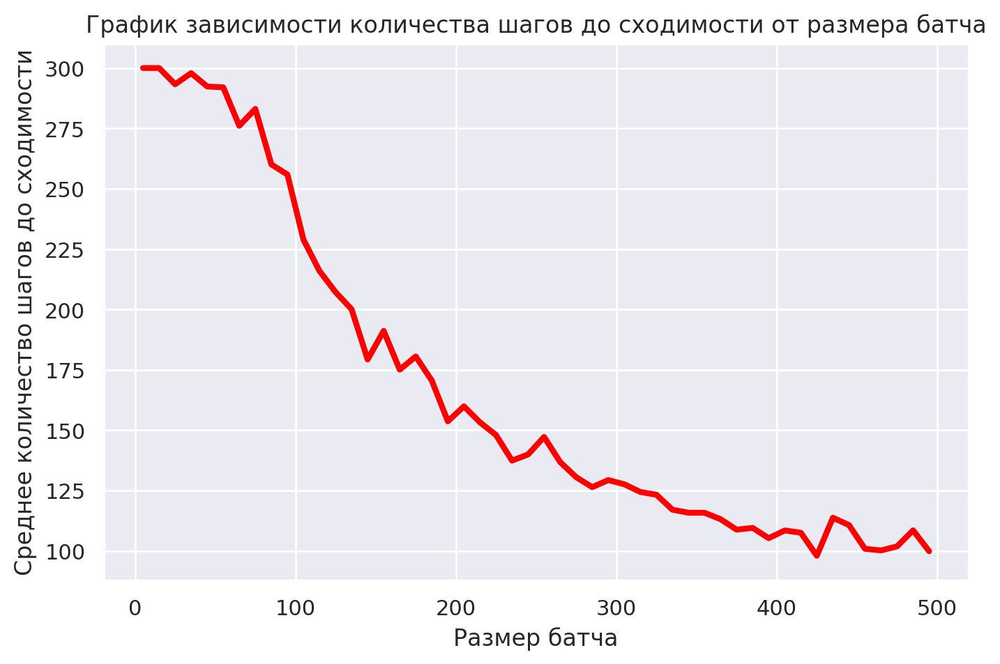

In [ ]:
x = batch_sizes
y = arr_mean_iter
plt.plot(x, y, color='pink')
plt.xlabel('Размер батча')
plt.ylabel('Среднее количество шагов до сходимости')
plt.title('График зависимости количества шагов до сходимости от размера батча')
plt.show()

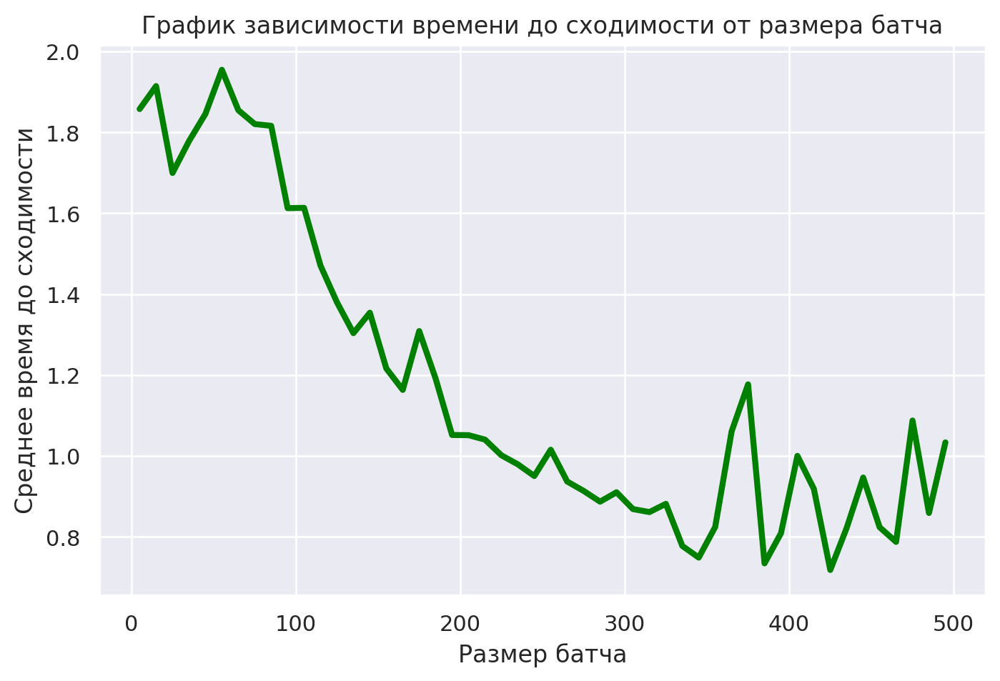

In [ ]:
x = batch_sizes
y = arr_mean_time
plt.plot(x, y, color='green', linewidth=3)
plt.xlabel('Размер батча')
plt.ylabel('Среднее время до сходимости')
plt.title('График зависимости времени до сходимости от размера батча')
plt.show()

Можно заметить следующие зависимости:

1) с ростом размера батча уменьшается среднее количество шагов до сходимости: это можно объяснить тем, что обновляя градиентна большем числе объектов мы оцениваем его точнее и стохастический градиентный спуск сходится за меньшее число шагов

2) с ростом размера батча уменьшается среднее время до сходимости (но не так плавно, как среднее количество шагов до сходимости): возможно, это происходит, так как по той же причине, что написана выше мы оцениваем градиент точнее и SGD сходится за меньшее время

## Задание 7. Регуляризация (1 балл)

В этом задании вам предстоит исследовать влияние регуляризации на работу различных методов градиентного спуска. Напомним, регуляризация - это добавка к функции потерь, которая штрафует за норму весов. Мы будем использовать l2 регуляризацию, таким образом функция потерь приобретает следующий вид:

$$
    Q(w) = \dfrac{1}{\ell} \sum\limits_{i=1}^{\ell} (a_w(x_i) - y_i)^2 + \dfrac{\mu}{2} \| w \|^2
$$

Допишите класс **BaseDescentReg** в файле `descents.py`.

Протестируйте ваше решение в контесте.

Вставьте ссылку на успешную посылку:

* **BaseDescentReg**: https://contest.yandex.ru/contest/70588/run-report/124812736/

Найдите лучшие параметры обучения с регуляризацией аналогично 5 заданию. Будем подбирать длину шага $\lambda$ (`lambda_`) и коэффициент регуляризации $\mu$ (`mu`).

Сравните для каждого метода результаты с регуляризацией и без регуляризации (нужно опять сохранить ошибку и качество по метрике $R^2$ на обучающей и тестовой выборках и количество итераций до сходимости).

Постройте для каждого метода график со значениями функции потерь MSE с регуляризацией и без регуляризации (всего должно получиться 4 графика).

Посмотрите на получившиеся результаты. Какие можно сделать выводы, как регуляризация влияет на сходимость? Как изменилось качество на обучающей выборке? На тестовой? Чем вы можете объяснить это?

In [ ]:
# YOUR CODE:
# посчитаем лучшую лямбду и мю для VanillaGradientDescent
lambda_vars = np.logspace(-3, 1, num=5)
mu_vars = np.logspace(-3, 0, num=5)
losses= []
for lam in lambda_vars:
  for mu in mu_vars:
    descent_config = {
        'descent_name': 'full',
        'regularized' : True,
        'kwargs': {
            'dimension': X_train.shape[1],
            'lambda_': lam,
            'mu': mu
        }
    }
    regression = LinearRegression(
        descent_config
        )
    regression.fit(X_train, y_train)
    losses.append(regression.calc_loss(X_val, y_val))
losses_arr = np.array(losses)
min_ind = np.argmin(losses_arr)
best_lambda_full = lambda_vars[min_ind // len(lambda_vars)]
best_mu_full = mu_vars[min_ind % len(mu_vars)]
print(best_lambda_full)
print(best_mu_full)

1.0
0.005623413251903491


In [ ]:
descent_config = {
      'descent_name': 'full',
      'regularized' : 'regularized',
      'kwargs': {
          'dimension': X_train.shape[1],
          'lambda_': best_lambda_full,
          'mu': best_mu_full
      }
  }
regression = LinearRegression(
    descent_config
    )
regression.fit(X_train, y_train)
from sklearn.metrics import r2_score
train_mse_full = regression.calc_loss(X_train, y_train)
test_mse_full = regression.calc_loss(X_test, y_test)
train_r2score_full = r2_score(y_train, regression.predict(X_train))
test_r2_score_full = r2_score(y_test, regression.predict(X_test))
print("Train MSE = %.4f" % train_mse_full)
print("Test MSE = %.4f" % test_mse_full)
print("Train R2 = %.4f" % train_r2score_full)
print("Test R2 = %.4f" % test_r2_score_full)

Train MSE = 0.4004
Test MSE = 0.3992
Train R2 = 0.6536
Test R2 = 0.6526


In [ ]:
loss_history_full = regression.loss_history
len(loss_history_full)

250

In [ ]:
full_metrics = np.array([train_mse_full, test_mse_full, train_r2score_full, test_r2_score_full, len(loss_history_full)])

In [ ]:
# посчитаем лучшую лямбду и мю для StochasticDescent
losses= []
for lam in lambda_vars:
  for mu in mu_vars:
    descent_config = {
        'descent_name': 'stochastic',
        'regularized' : True,
        'kwargs': {
            'dimension': X_train.shape[1],
            'lambda_': lam,
            'mu': mu
        }
    }
    regression = LinearRegression(
        descent_config
        )
    regression.fit(X_train, y_train.reset_index(drop=True))
    losses.append(regression.calc_loss(X_val, y_val))
losses_arr = np.array(losses)
min_ind = np.argmin(losses_arr)
best_lambda_stochastic = lambda_vars[min_ind // len(lambda_vars)]
best_mu_stochastic = mu_vars[min_ind % len(mu_vars)]
print(best_lambda_stochastic)
print(best_mu_stochastic)

1.0
0.001


In [56]:
descent_config = {
      'descent_name': 'stochastic',
      'regularized' : 'regularized',
      'kwargs': {
          'dimension': X_train.shape[1],
          'lambda_': best_lambda_stochastic,
          'mu': best_mu_stochastic
      }
  }
regression = LinearRegression(
    descent_config
    )
regression.fit(X_train, y_train.reset_index(drop=True))

train_mse_stochastic = regression.calc_loss(X_train, y_train)
test_mse_stochastic = regression.calc_loss(X_test, y_test)
train_r2score_stochastic = r2_score(y_train, regression.predict(X_train))
test_r2_score_stochastic = r2_score(y_test, regression.predict(X_test))
print("Train MSE = %.4f" % train_mse_stochastic)
print("Test MSE = %.4f" % test_mse_stochastic)
print("Train R2 = %.4f" % train_r2score_stochastic)
print("Test R2 = %.4f" % test_r2_score_stochastic)

Train MSE = 0.3642
Test MSE = 0.3609
Train R2 = 0.6849
Test R2 = 0.6860


In [57]:
loss_history_stochastic = regression.loss_history
len(loss_history_stochastic)

301

In [58]:
stochastic_metrics = np.array([train_mse_stochastic, test_mse_stochastic, train_r2score_stochastic, test_r2_score_stochastic, len(loss_history_stochastic)])

In [59]:
# посчитаем лучшую лямбду для MomentumDescent
losses= []
for lam in lambda_vars:
  for mu in mu_vars:
    descent_config = {
        'descent_name': 'momentum',
        'regularized' : True,
        'kwargs': {
            'dimension': X_train.shape[1],
            'lambda_': lam,
            'mu': mu
        }
    }
    regression = LinearRegression(
        descent_config
        )
    regression.fit(X_train, y_train)
    losses.append(regression.calc_loss(X_val, y_val))
losses_arr = np.array(losses)
min_ind = np.argmin(losses_arr)
best_lambda_momentum = lambda_vars[min_ind // len(lambda_vars)]
best_mu_momentum = mu_vars[min_ind % len(mu_vars)]
print(best_lambda_momentum)
print(best_mu_momentum)

1.0
0.001


In [60]:
descent_config = {
      'descent_name': 'momentum',
      'regularized' : 'regularized',
      'kwargs': {
          'dimension': X_train.shape[1],
          'lambda_': best_lambda_momentum,
          'mu': best_mu_momentum
      }
  }
regression = LinearRegression(
    descent_config
    )
regression.fit(X_train, y_train)

train_mse_momentum = regression.calc_loss(X_train, y_train)
test_mse_momentum = regression.calc_loss(X_test, y_test)
train_r2score_momentum = r2_score(y_train, regression.predict(X_train))
test_r2_score_momentum = r2_score(y_test, regression.predict(X_test))
print("Train MSE = %.4f" % train_mse_momentum)
print("Test MSE = %.4f" % test_mse_momentum)
print("Train R2 = %.4f" % train_r2score_momentum)
print("Test R2 = %.4f" % test_r2_score_momentum)

Train MSE = 0.2471
Test MSE = 0.2458
Train R2 = 0.7863
Test R2 = 0.7861


In [61]:
loss_history_momentum = regression.loss_history
len(loss_history_momentum)

301

In [62]:
momentum_metrics = np.array([train_mse_momentum, test_mse_momentum, train_r2score_momentum, test_r2_score_momentum, len(loss_history_momentum)])

In [63]:
# посчитаем лучшую лямбду и мю для AdamDescent
losses= []
for lam in lambda_vars:
 for mu in mu_vars:
   descent_config = {
       'descent_name': 'adam',
       'regularized' : True,
       'kwargs': {
           'dimension': X_train.shape[1],
           'lambda_': lam,
           'mu': mu
       }
   }
   regression = LinearRegression(
       descent_config
       )
   regression.fit(X_train, y_train)
   losses.append(regression.calc_loss(X_val, y_val))
losses_arr = np.array(losses)
min_ind = np.argmin(losses_arr)
best_lambda_adam = lambda_vars[min_ind // len(lambda_vars)]
best_mu_adam = mu_vars[min_ind % len(mu_vars)]
print(best_lambda_adam)
print(best_mu_adam)

10.0
0.001


In [66]:
descent_config = {
     'descent_name': 'adam',
     'regularized' : 'regularized',
     'kwargs': {
         'dimension': X_train.shape[1],
         'lambda_': best_lambda_adam,
         'mu': best_mu_adam
     }
 }
regression = LinearRegression(
   descent_config
   )
regression.fit(X_train, y_train)


train_mse_adam = regression.calc_loss(X_train, y_train)
test_mse_adam = regression.calc_loss(X_test, y_test)
train_r2score_adam = r2_score(y_train, regression.predict(X_train))
test_r2_score_adam = r2_score(y_test, regression.predict(X_test))
print("Train MSE = %.4f" % train_mse_adam)
print("Test MSE = %.4f" % test_mse_adam)
print("Train R2 = %.4f" % train_r2score_adam)
print("Test R2 = %.4f" % test_r2_score_adam)

Train MSE = 0.2375
Test MSE = 0.2378
Train R2 = 0.7946
Test R2 = 0.7931


In [67]:
loss_history_adam = regression.loss_history
len(loss_history_adam)

301

In [68]:
adam_metrics = np.array([train_mse_adam, test_mse_adam, train_r2score_adam, test_r2_score_adam, len(loss_history_adam)])

те графики не успеваю, могу только такой

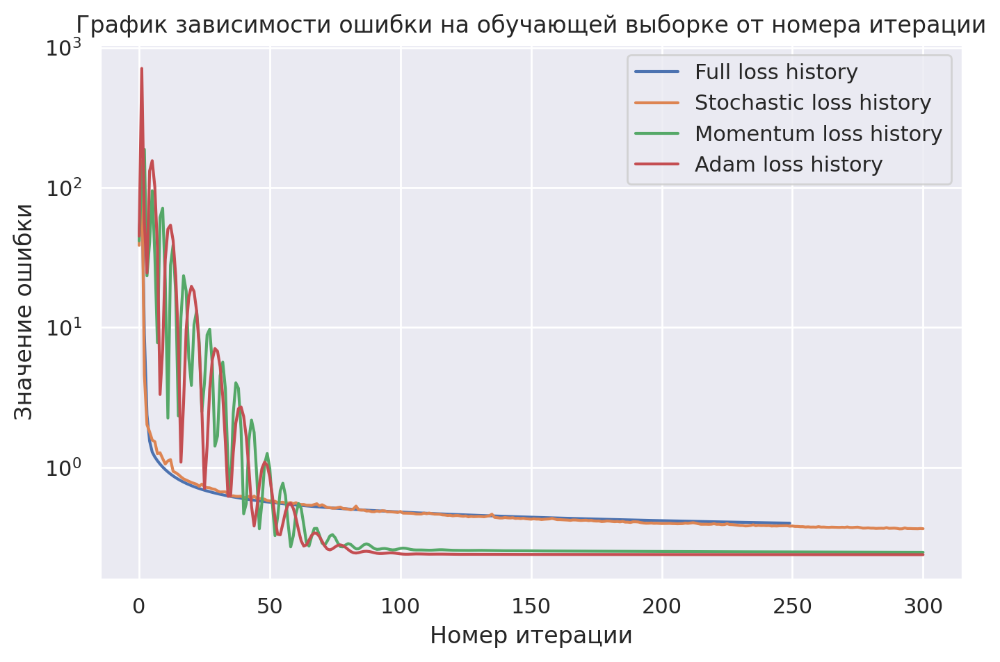

In [69]:
ser_full = pd.Series(loss_history_full)
ser_stochastic = pd.Series(loss_history_stochastic)
ser_momentum = pd.Series(loss_history_momentum)
ser_adam = pd.Series(loss_history_adam)
plt.plot(ser_full, label='Full loss history')
plt.plot(ser_stochastic, label='Stochastic loss history')
plt.plot(ser_momentum, label='Momentum loss history')
plt.plot(ser_adam, label='Adam loss history')
plt.title('График зависимости ошибки на обучающей выборке от номера итерации')
plt.yscale('log')
plt.xlabel('Номер итерации')
plt.ylabel('Значение ошибки')
plt.legend()
plt.show()

вообще благодаря регуляризации показатели должны были улучшиться (если нет, то это из-за маленького диапазона перебора лямбд и мю - больше 5 не успел бы колаб прогрузить до дд)

можно заметить, что из-за регуляризации кол-во итераций всех спусков выросло, у моментума и адама разбросы, которые до этого были небольшими, тоже увеличились

вместо графиков MSE предлагаю сравнить два датафрейма (в конце 5 задания и этот), запустите эту ячейку, пожалуйста, а то колаб в посл момент слетел

In [ ]:
array_metrics = np.array([full_metrics, stochastic_metrics, momentum_metrics, adam_metrics])
df_metrics = pd.DataFrame(array_metrics, columns=['train_mse', 'test_mse', 'train_r2score', 'test_r2score', 'length_loss_history'], index=['full', 'stochastic', 'momentum', 'adam'])
df_metrics

`### ваше решение тут ###`

## Задание 8. Альтернативная функция потерь (1 балл)

В этом задании вам предстоит использовать другую функцию потерь для нашей задачи регрессии. В качестве функции потерь мы выбрали **Log-Cosh**:

$$
    L(y, a)
    =
    \log\left(\cosh(a - y)\right).
$$

Самостоятельно продифференцируйте данную функцию потерь чтобы найти её градиент _(требуется показать не только результат, но и промежуточные вычисления)_:

`### ваше решение тут ###`

Программно реализуйте градиентный спуск с данной функцией потерь в файле `descents.py`, обучите все четыре метода (без регуляризации) аналогично 5 заданию, сравните их качество с четырьмя методами из 5 задания.

Пример того, как можно запрограммировать использование нескольких функций потерь внутри одного класса градиентного спуска:


```python
from enum import auto
from enum import Enum

import numpy as np

class LossFunction(Enum):
    MSE = auto()
    MAE = auto()
    LogCosh = auto()
    Huber = auto()

...
class BaseDescent:
    def __init__(self, loss_function: LossFunction = LossFunction.MSE):
        self.loss_function: LossFunction = loss_function

    def calc_gradient(self, x: np.ndarray, y: np.ndarray) -> np.ndarray:
        if self.loss_function is LossFunction.MSE:
            return ...
        elif self.loss_function is LossFunction.LogCosh:
            return ...
...

```

In [ ]:
# YOUR CODE:

### Кулинарно-социализационный бонус. (0.5 балла).

Как мы знаем, осень прекрасная пора, время пробовать новое и делиться теплом с друзьями и близкими. Выберите рецепт, который соответствует вашему настроению, приготовьте выбранное блюдо и угостите хотя бы одного человека им. Кратко опишите ваши впечатления, прикрепите рецепт и фотографии блюда и довольного гостя.

Мои впечатления: Я не ожидал, но мне понравилось готовить. В процессе готовки я смог отвлечься от повседневных дел и сфокусироваться на еде. Мне и моему другу, которого я угостил, понравилось приготовленное мной блюдо, поэтому, думаю, в будущем я буду чаще готовить для своей семьи и друзей.

Рецепт:

ингредиенты:
- макаронные изделия Barilla Cannelloni (250 г)
- фарш мясной (500 г)
- лук репчатый (1 шт)
- морковь (1 шт)
- грибы шампиньоны (200 г)
- соль, перец (по вкусу)
- растительное масло для жарки
- масло сливочное (20 г)
- сливки для соуса 20% (500 мл)
- сыр (150 г)

процесс приготовления:

1) Обжарить лук, морковь, грибы.

2) Смешать с фаршем, посолить, поперчить.

3) Наполнить канеллонни фаршем.

4) Выложить их на противень, смазанный сливочным маслом.

5) Залить сливками и сверху посыпать натертым сыром.

6) Запекать в духовке на 180 градусах в течение 60 минут.

`### ваш кулинарный опыт тут ###`




Фотографии:
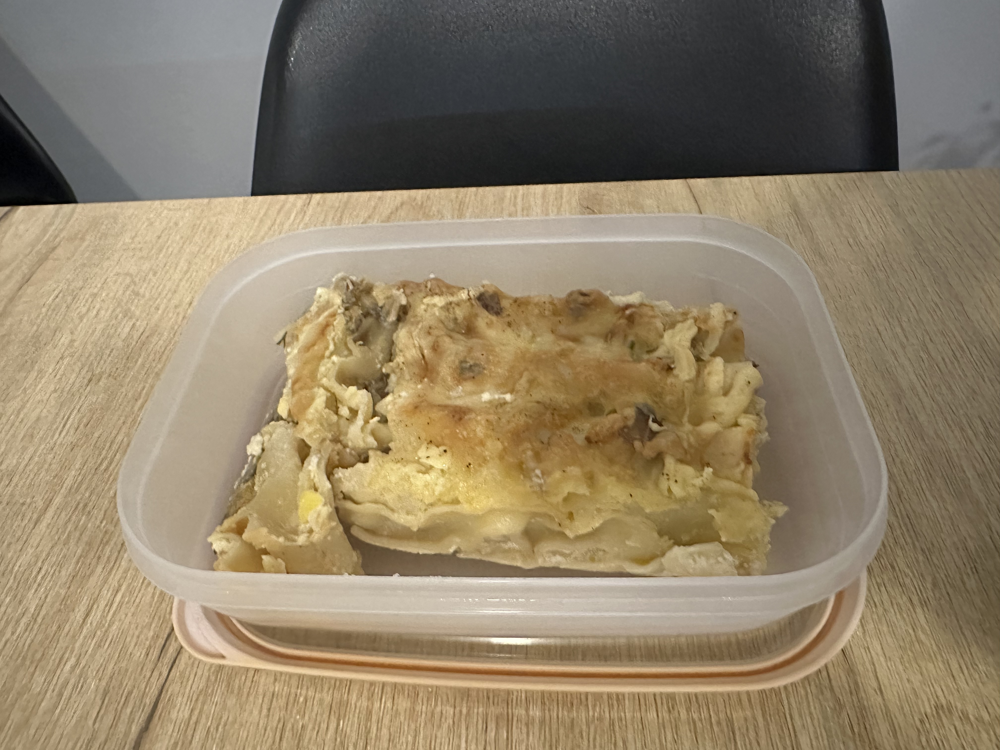

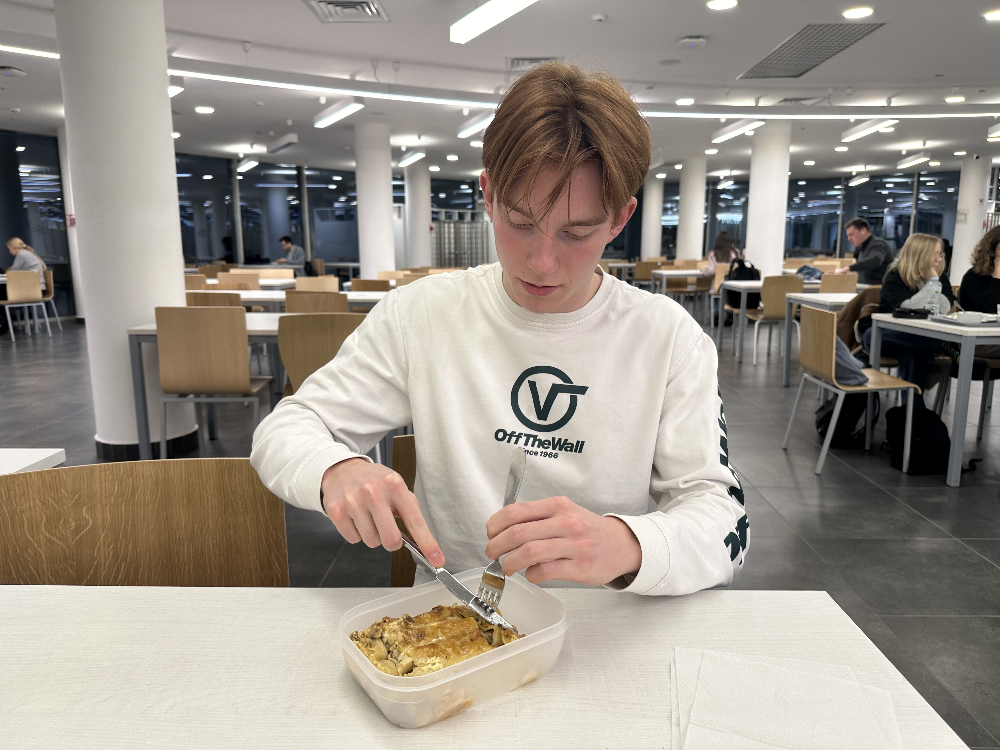

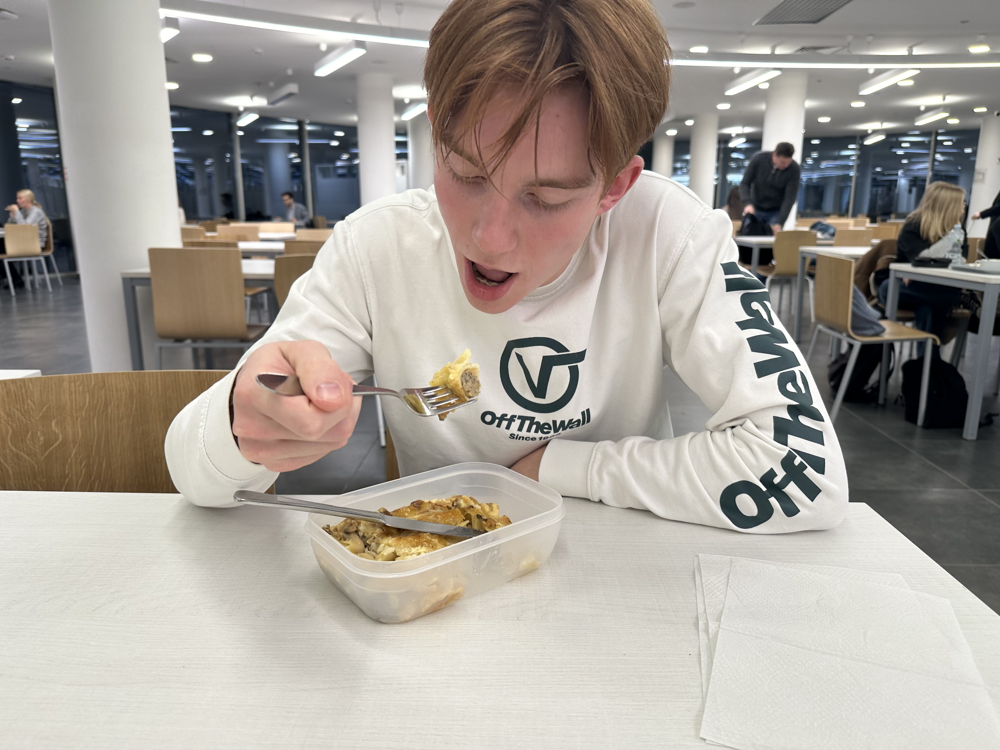

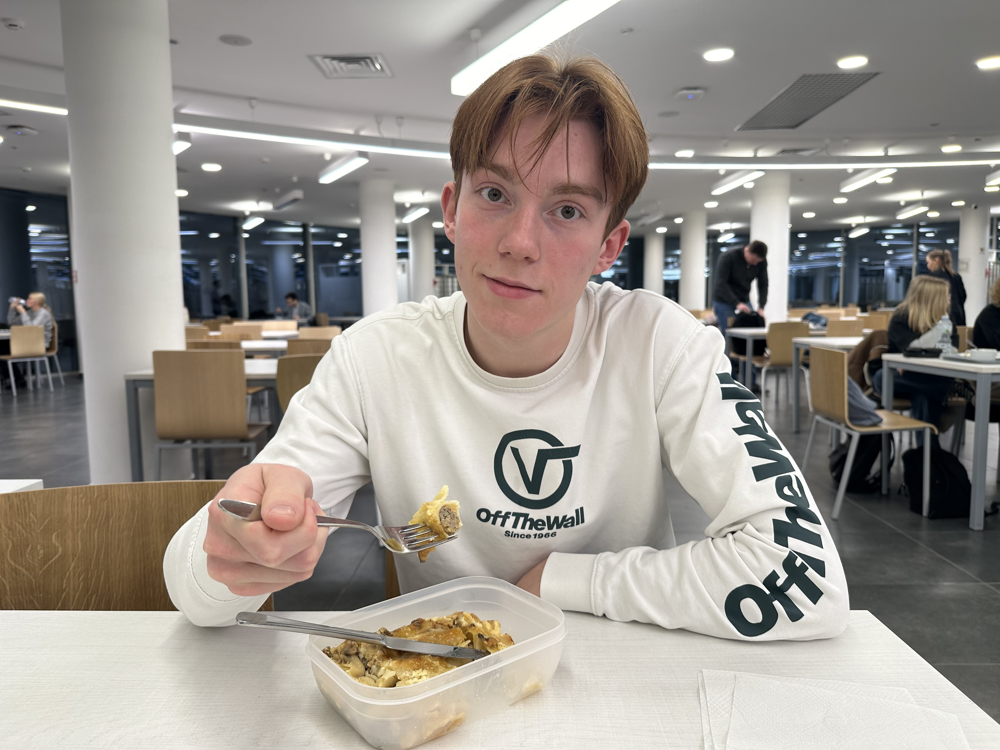

### Бонус 1. Другие методы градиентного спуска (1 балл).

По желанию выберите метод градиентного спуска из следующего списка и самостоятельно реализуйте его в файле `descents.py`. Обучите линейную регрессию с помощью этого метода, сравните с методами из основной части домашнего задания.

`AdaMax` (вариация Adam основанная на $l_{\infty}$), `Nadam` (вариация Adam совмещенная с методом импульса Нестерова), `AMSGrad` (ещё одна вариация Adam).

In [ ]:
# YOUR CODE:

### Бонус 2. Другие функции потерь (1 балл).

Аналогично 8 заданию реализуйте две функции потерь - **MAE** и **Huber**.

Самостоятельно продифференцируйте данные функции потерь, чтобы найти их градиенты _(требуется показать не только результат, но и промежуточные вычисления)_:

`### ваше решение тут ###`

Программно реализуйте градиентный спуск с данными функциями потерь в файле `descents.py`, обучите все четыре метода (без регуляризации) аналогично 5 заданию, сравните их качество с четырьмя методами из 5 задания.

Сравните между собой *для каждого метода отдельно* качество для разных функций потерь. Какая оказалась лучше? Как вы думаете почему?

In [ ]:
# YOUR CODE: